<a href="https://colab.research.google.com/github/liebesbachlein/ml_t1d/blob/main/ML_2024_Part2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import sklearn.model_selection as skm
import numpy as np
import sklearn.metrics

import tensorflow as tf
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Input
from keras.layers import Conv1D, MaxPooling1D, Reshape
from keras.callbacks import ModelCheckpoint
from keras.models import model_from_json
from keras import backend as K

def rmseData(x_test, y_pred):
  true = []
  pred = []
  for i in range(len(y_pred)):
    for j in range(108):
      if x_test[i].T[0][j] != 0:
        true.append(x_test[i].T[0][j])
        pred.append(y_pred[i][j])
  return sklearn.metrics.mean_squared_error(true, pred, squared=False)

def maeData(x_test, y_pred):
  true = []
  pred = []
  for i in range(len(y_pred)):
    for j in range(108):
      if x_test[i].T[0][j] != 0:
        true.append(x_test[i].T[0][j])
        pred.append(y_pred[i][j])
  return sklearn.metrics.mean_absolute_error(true, pred)

def mapeData(x_test, y_pred):
  true = []
  pred = []
  for i in range(len(y_pred)):
    for j in range(108):
      if x_test[i].T[0][j] != 0:
        true.append(x_test[i].T[0][j])
        pred.append(y_pred[i][j])
  return sklearn.metrics.mean_absolute_percentage_error(true, pred)

In [ ]:
df_cgm = pd.read_csv('drive/MyDrive/Senior Project: Diabetes T1/Datasets/Dataset#2/Processed/cont_gm_6_to_24_aligned_cleaned.csv')
df_ibg = pd.read_csv('drive/MyDrive/Senior Project: Diabetes T1/Datasets/Dataset#2/Processed/inter_bg_6_to_24_aligned_cleaned.csv')
df_i = df_ibg.drop(columns=['PtID', 'Dt'])
df_c = df_cgm.drop(columns=['PtID', 'Dt'])

X_train, X_test, y_train, y_test = skm.train_test_split(df_i, df_c, test_size=0.2, random_state=0)
X_train = X_train.values.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.values.reshape(X_test.shape[0], X_test.shape[1], 1)

In [ ]:
print(['rmse: ', rmseData(X_test, y_test.values)])
print(['mae: ', maeData(X_test, y_test.values)])
print(['mape: ', mapeData(X_test, y_test.values)])
#True values

['rmse: ', 0.70891874673596]
['mae: ', 0.5492276887871853]
['mape: ', 0.07269470657618221]


#How many epochs needed?

##20 epochs

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)
epochs = 20
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/20
364/364 - 7s - loss: 8.9279 - mean_absolute_error: 2.2122 - val_loss: 5.5534 - val_mean_absolute_error: 1.7570 - 7s/epoch - 19ms/step
Epoch 2/20
364/364 - 6s - loss: 5.5722 - mean_absolute_error: 1.7394 - val_loss: 5.4073 - val_mean_absolute_error: 1.7028 - 6s/epoch - 16ms/step
Epoch 3/20
364/364 - 5s - loss: 5.4354 - mean_absolute_error: 1.7106 - val_loss: 5.2721 - val_mean_absolute_error: 1.6661 - 5s/epoch - 15ms/step
Epoch 4/20
364/364 - 5s - loss: 5.4014 - mean_absolute_error: 1.7042 - val_loss: 5.2779 - val_mean_absolute_error: 1.6843 - 5s/epoch - 12ms/step
Epoch 5/20
364/364 - 5s - loss: 5.3809 - mean_absolute_error: 1.6992 - val_loss: 5.2778 - val_mean_absolute_error: 1.6707 - 5s/epoch - 13ms/step
Epoch 6/20
364/364 - 3s - loss: 5.3851 - mean_absolute_error: 1.7004 - val_loss: 5.2889 - val_mean_absolute_error: 1.6946 - 3s/epoch - 9ms/step
Epoch 7/20
364/364 - 3s - loss: 5.3046 - mean_absolute_error: 1.6823 - val_loss: 5.2934 - val_mean_absolute_error: 1.6610 - 3s/epoc

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 0s 3ms/step
['rmse: ', 1.0634076731755833]
['mae: ', 0.7747535252093724]
['mape: ', 0.11135156566026508]


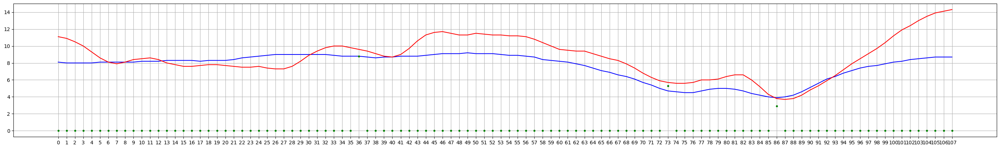

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

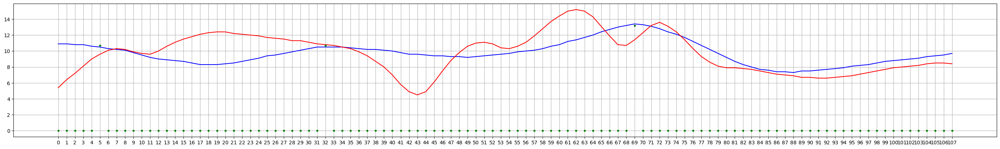

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

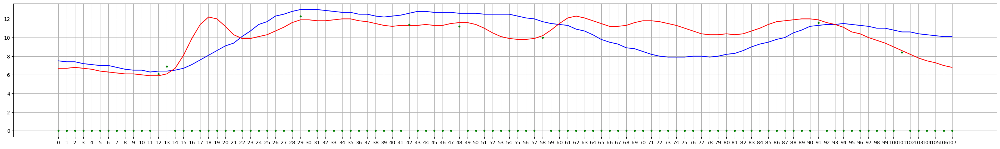

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

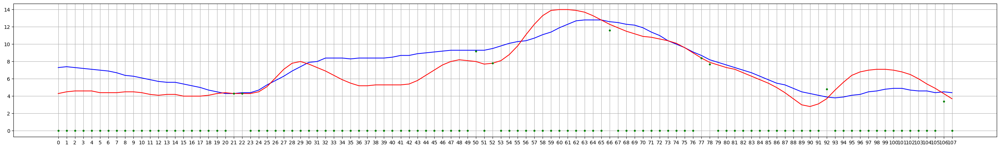

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

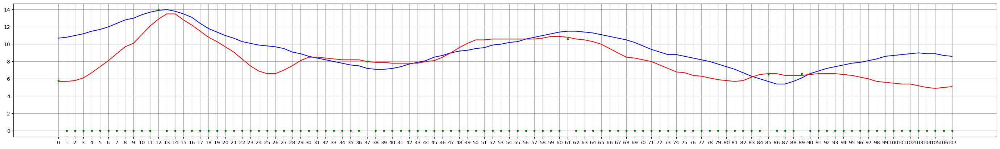

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

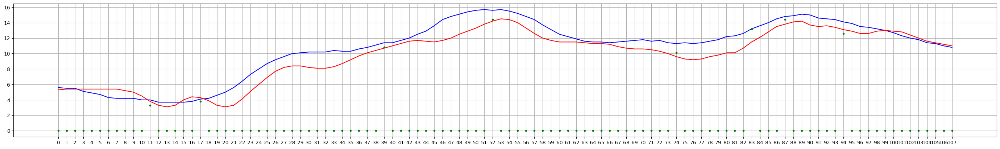

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

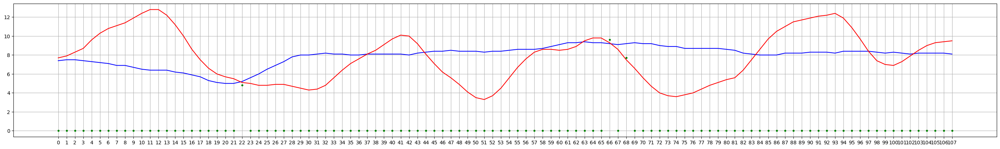

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##50 epochs THIS

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

In [ ]:
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)

In [ ]:
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 4s - loss: 8.9334 - mean_absolute_error: 2.2070 - val_loss: 5.5542 - val_mean_absolute_error: 1.7356 - 4s/epoch - 12ms/step
Epoch 2/50
364/364 - 3s - loss: 5.5757 - mean_absolute_error: 1.7392 - val_loss: 5.3287 - val_mean_absolute_error: 1.6693 - 3s/epoch - 9ms/step
Epoch 3/50
364/364 - 5s - loss: 5.4899 - mean_absolute_error: 1.7220 - val_loss: 5.3288 - val_mean_absolute_error: 1.6596 - 5s/epoch - 13ms/step
Epoch 4/50
364/364 - 3s - loss: 5.4062 - mean_absolute_error: 1.7052 - val_loss: 5.3273 - val_mean_absolute_error: 1.6772 - 3s/epoch - 9ms/step
Epoch 5/50
364/364 - 3s - loss: 5.4021 - mean_absolute_error: 1.7052 - val_loss: 5.5013 - val_mean_absolute_error: 1.7256 - 3s/epoch - 9ms/step
Epoch 6/50
364/364 - 4s - loss: 5.3494 - mean_absolute_error: 1.6934 - val_loss: 5.3976 - val_mean_absolute_error: 1.6688 - 4s/epoch - 10ms/step
Epoch 7/50
364/364 - 4s - loss: 5.3571 - mean_absolute_error: 1.6943 - val_loss: 5.3337 - val_mean_absolute_error: 1.6826 - 4s/epoch 

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 0s 3ms/step
['rmse: ', 1.062881166926326]
['mae: ', 0.8064523874758583]
['mape: ', 0.10788476575477916]


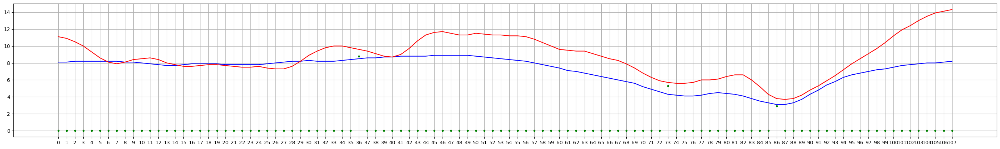

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

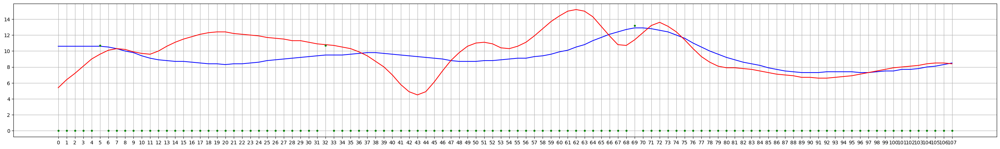

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

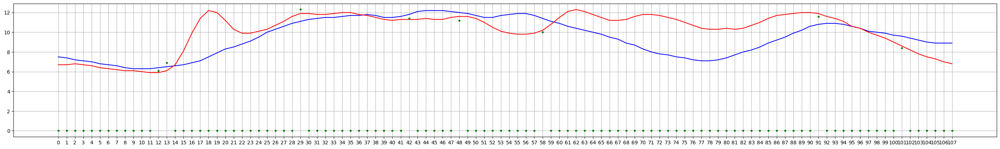

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

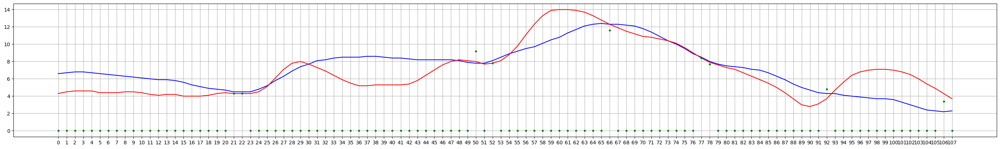

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

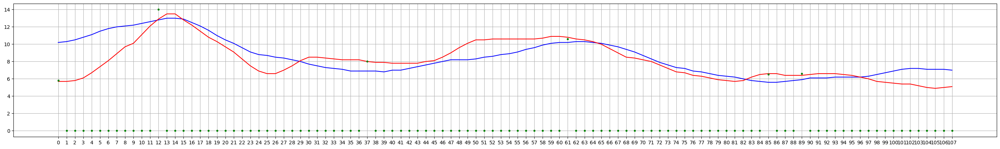

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

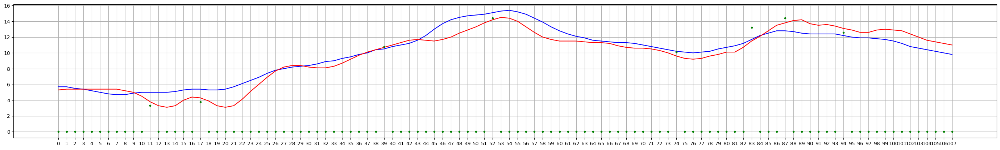

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

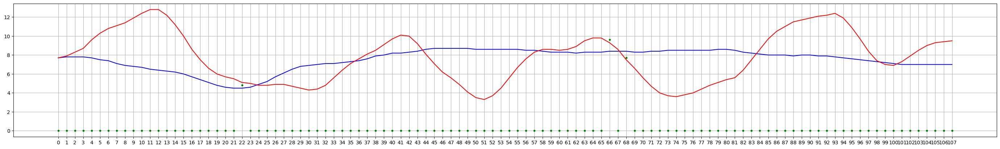

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##75 epochs

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)
epochs = 75
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/75
364/364 - 8s - loss: 9.3274 - mean_absolute_error: 2.2673 - val_loss: 5.7619 - val_mean_absolute_error: 1.7767 - 8s/epoch - 22ms/step
Epoch 2/75
364/364 - 5s - loss: 5.6750 - mean_absolute_error: 1.7620 - val_loss: 5.4210 - val_mean_absolute_error: 1.7295 - 5s/epoch - 14ms/step
Epoch 3/75
364/364 - 6s - loss: 5.4937 - mean_absolute_error: 1.7232 - val_loss: 5.2718 - val_mean_absolute_error: 1.6834 - 6s/epoch - 16ms/step
Epoch 4/75
364/364 - 5s - loss: 5.4537 - mean_absolute_error: 1.7152 - val_loss: 5.3333 - val_mean_absolute_error: 1.6768 - 5s/epoch - 14ms/step
Epoch 5/75
364/364 - 5s - loss: 5.3929 - mean_absolute_error: 1.7012 - val_loss: 5.3226 - val_mean_absolute_error: 1.6808 - 5s/epoch - 15ms/step
Epoch 6/75
364/364 - 6s - loss: 5.3871 - mean_absolute_error: 1.7022 - val_loss: 5.2772 - val_mean_absolute_error: 1.6782 - 6s/epoch - 16ms/step
Epoch 7/75
364/364 - 5s - loss: 5.3713 - mean_absolute_error: 1.6996 - val_loss: 5.2564 - val_mean_absolute_error: 1.6673 - 5s/epo

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 0s 3ms/step
['rmse: ', 1.1150524637231856]
['mae: ', 0.8195888792970633]
['mape: ', 0.10673803795537799]


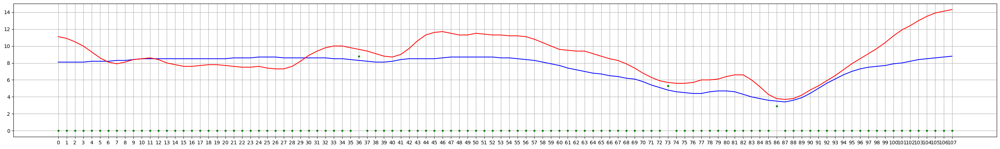

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

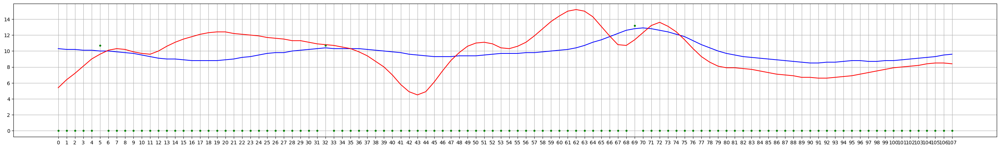

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

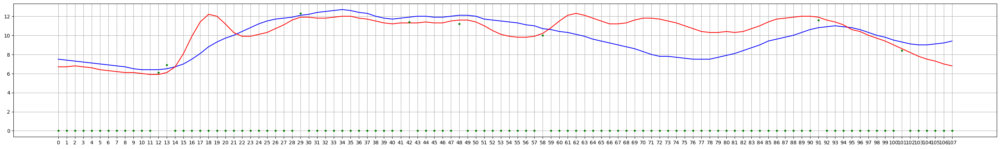

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

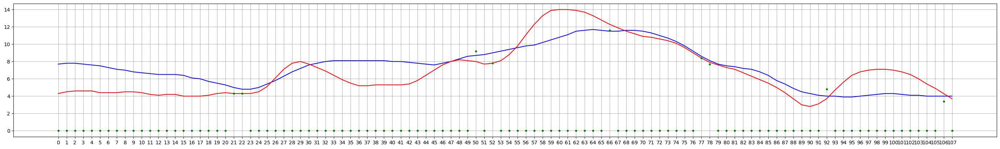

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

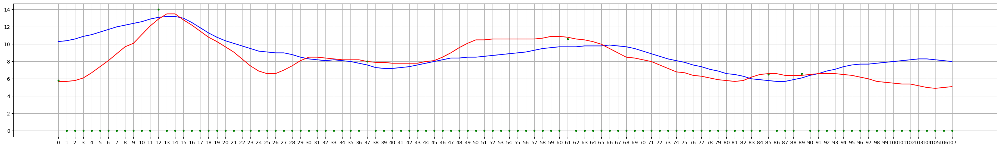

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

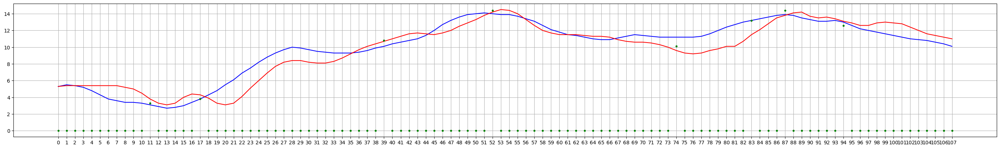

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

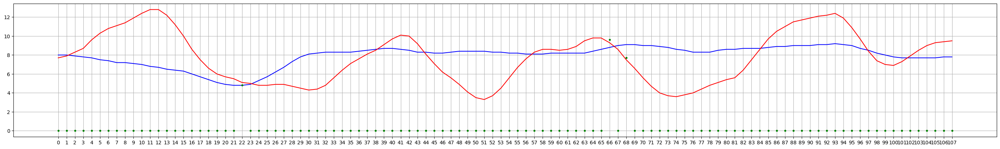

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##150 epochs

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

In [ ]:
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)

In [ ]:
epochs = 150
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/150
364/364 - 4s - loss: 4.6765 - mean_absolute_error: 1.5779 - val_loss: 5.5196 - val_mean_absolute_error: 1.7137 - 4s/epoch - 12ms/step
Epoch 2/150
364/364 - 4s - loss: 4.6675 - mean_absolute_error: 1.5775 - val_loss: 5.5392 - val_mean_absolute_error: 1.7017 - 4s/epoch - 10ms/step
Epoch 3/150
364/364 - 3s - loss: 4.6721 - mean_absolute_error: 1.5774 - val_loss: 5.5328 - val_mean_absolute_error: 1.7160 - 3s/epoch - 9ms/step
Epoch 4/150
364/364 - 3s - loss: 4.6771 - mean_absolute_error: 1.5781 - val_loss: 5.4943 - val_mean_absolute_error: 1.7090 - 3s/epoch - 9ms/step
Epoch 5/150
364/364 - 4s - loss: 4.6879 - mean_absolute_error: 1.5791 - val_loss: 5.6154 - val_mean_absolute_error: 1.7375 - 4s/epoch - 12ms/step
Epoch 6/150
364/364 - 3s - loss: 4.6777 - mean_absolute_error: 1.5775 - val_loss: 5.5249 - val_mean_absolute_error: 1.7229 - 3s/epoch - 9ms/step
Epoch 7/150
364/364 - 3s - loss: 4.6772 - mean_absolute_error: 1.5783 - val_loss: 5.5000 - val_mean_absolute_error: 1.7005 - 3s

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 0s 3ms/step
['rmse: ', 1.1834632131208034]
['mae: ', 0.8250091604612239]
['mape: ', 0.10830566344663003]


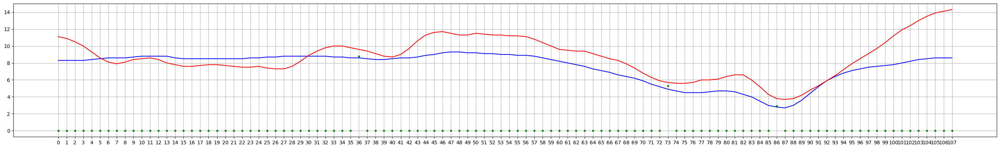

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

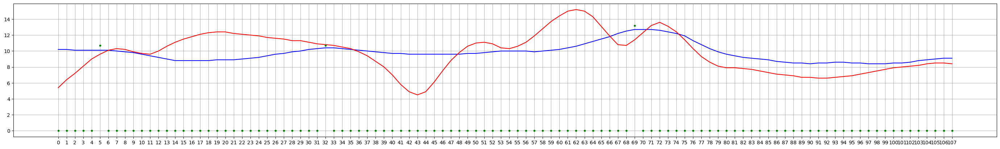

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

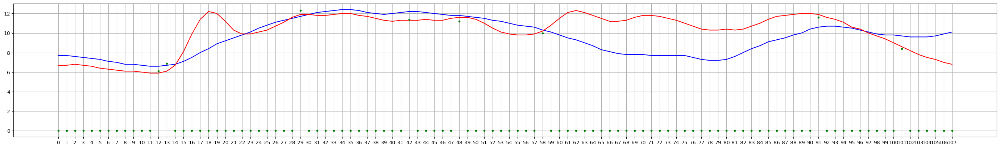

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

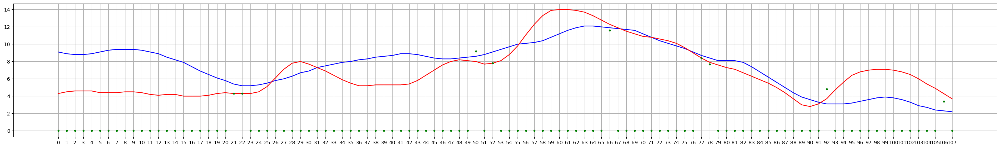

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

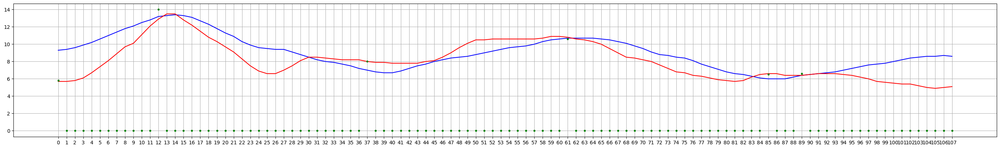

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

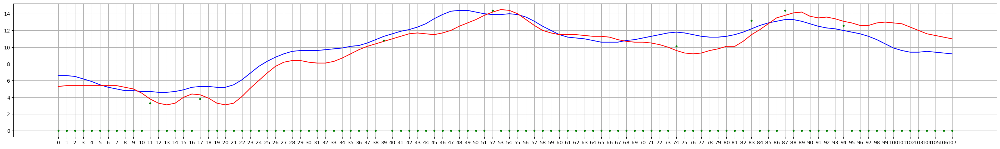

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

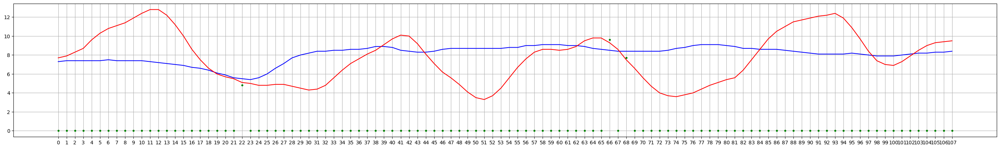

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##200 epochs

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

In [ ]:
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)

In [ ]:
epochs = 200
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/200
364/364 - 6s - loss: 8.7890 - mean_absolute_error: 2.1791 - val_loss: 5.6151 - val_mean_absolute_error: 1.7738 - 6s/epoch - 16ms/step
Epoch 2/200
364/364 - 3s - loss: 5.5692 - mean_absolute_error: 1.7389 - val_loss: 5.3484 - val_mean_absolute_error: 1.6940 - 3s/epoch - 9ms/step
Epoch 3/200
364/364 - 3s - loss: 5.4466 - mean_absolute_error: 1.7137 - val_loss: 5.3106 - val_mean_absolute_error: 1.6724 - 3s/epoch - 9ms/step
Epoch 4/200
364/364 - 5s - loss: 5.4220 - mean_absolute_error: 1.7064 - val_loss: 5.3496 - val_mean_absolute_error: 1.6680 - 5s/epoch - 13ms/step
Epoch 5/200
364/364 - 3s - loss: 5.3918 - mean_absolute_error: 1.7025 - val_loss: 5.5059 - val_mean_absolute_error: 1.7513 - 3s/epoch - 9ms/step
Epoch 6/200
364/364 - 3s - loss: 5.3635 - mean_absolute_error: 1.6967 - val_loss: 5.3653 - val_mean_absolute_error: 1.6754 - 3s/epoch - 9ms/step
Epoch 7/200
364/364 - 4s - loss: 5.3496 - mean_absolute_error: 1.6940 - val_loss: 5.3210 - val_mean_absolute_error: 1.6953 - 4s/

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 0s 4ms/step
['rmse: ', 1.091649442303499]
['mae: ', 0.7870156702242399]
['mape: ', 0.10390079069164046]


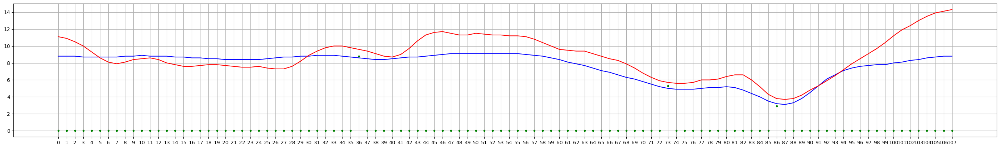

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

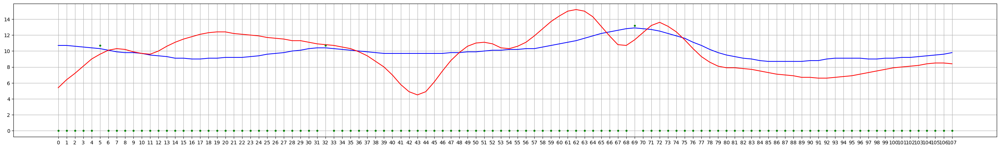

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

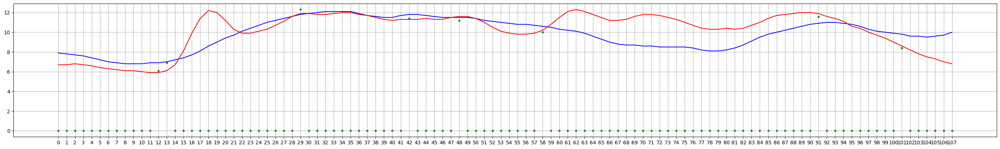

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

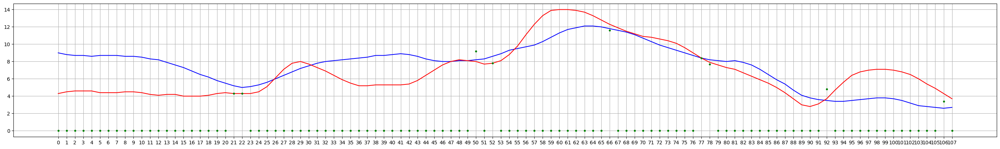

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

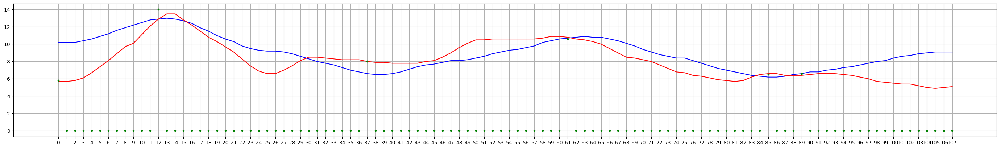

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

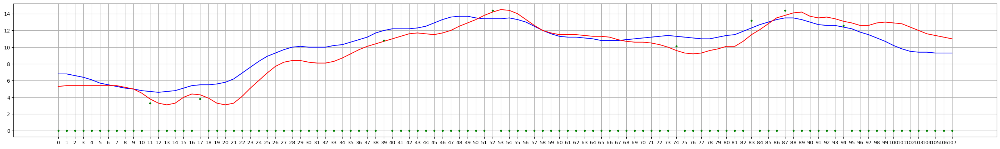

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

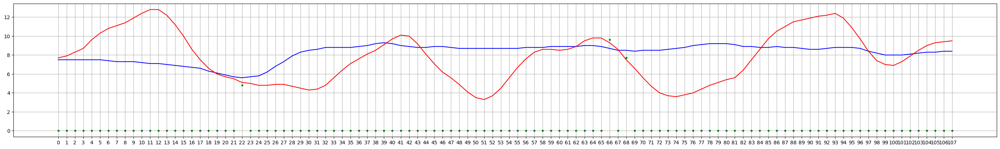

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##250 epochs

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

In [ ]:
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)

In [ ]:
epochs = 250
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/250
364/364 - 5s - loss: 9.4137 - mean_absolute_error: 2.2928 - val_loss: 5.8063 - val_mean_absolute_error: 1.7635 - 5s/epoch - 15ms/step
Epoch 2/250
364/364 - 4s - loss: 5.6204 - mean_absolute_error: 1.7491 - val_loss: 5.3486 - val_mean_absolute_error: 1.7120 - 4s/epoch - 10ms/step
Epoch 3/250
364/364 - 3s - loss: 5.4733 - mean_absolute_error: 1.7193 - val_loss: 5.2813 - val_mean_absolute_error: 1.6825 - 3s/epoch - 9ms/step
Epoch 4/250
364/364 - 3s - loss: 5.4438 - mean_absolute_error: 1.7124 - val_loss: 5.4089 - val_mean_absolute_error: 1.7139 - 3s/epoch - 9ms/step
Epoch 5/250
364/364 - 5s - loss: 5.3792 - mean_absolute_error: 1.6996 - val_loss: 5.3526 - val_mean_absolute_error: 1.6811 - 5s/epoch - 14ms/step
Epoch 6/250
364/364 - 4s - loss: 5.3637 - mean_absolute_error: 1.6976 - val_loss: 5.2960 - val_mean_absolute_error: 1.6719 - 4s/epoch - 10ms/step
Epoch 7/250
364/364 - 3s - loss: 5.3423 - mean_absolute_error: 1.6915 - val_loss: 5.3633 - val_mean_absolute_error: 1.6630 - 3

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 5ms/step
['rmse: ', 1.2034735798742138]
['mae: ', 0.84915779193339]
['mape: ', 0.10999934443923988]


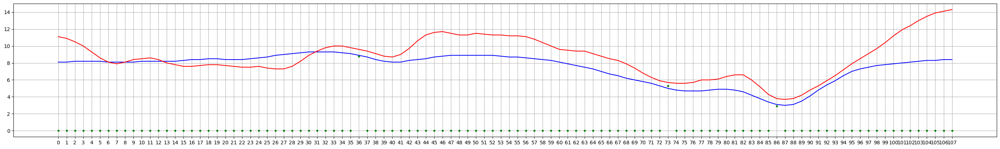

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

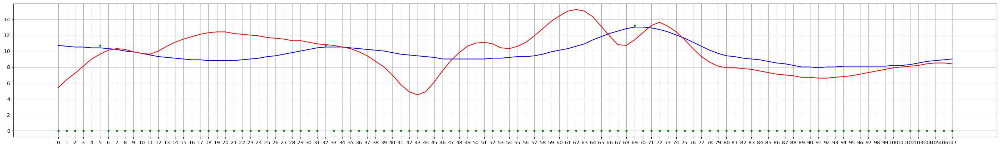

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

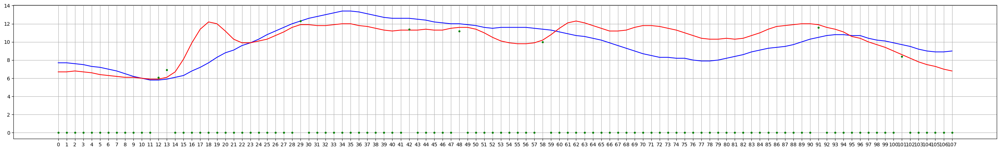

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

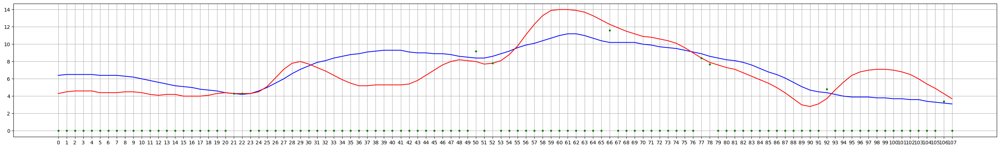

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

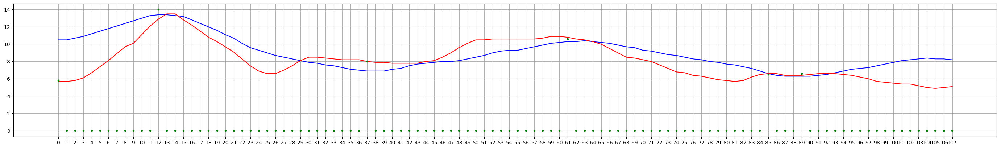

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

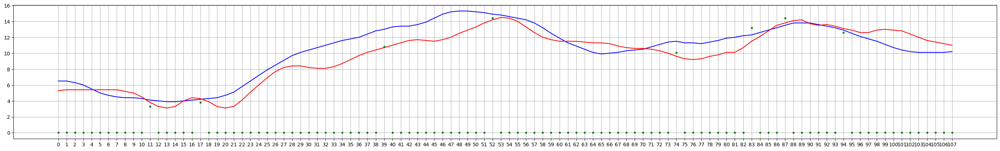

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

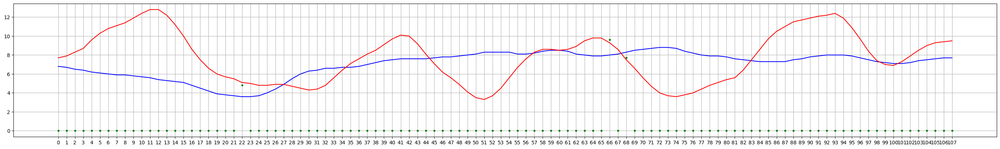

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##300 epochs

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

In [ ]:
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)

In [ ]:
epochs = 300
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/300
364/364 - 6s - loss: 9.3213 - mean_absolute_error: 2.2722 - val_loss: 5.8159 - val_mean_absolute_error: 1.8012 - 6s/epoch - 16ms/step
Epoch 2/300
364/364 - 4s - loss: 5.6341 - mean_absolute_error: 1.7528 - val_loss: 5.4258 - val_mean_absolute_error: 1.7090 - 4s/epoch - 12ms/step
Epoch 3/300
364/364 - 3s - loss: 5.5053 - mean_absolute_error: 1.7267 - val_loss: 5.3394 - val_mean_absolute_error: 1.6788 - 3s/epoch - 9ms/step
Epoch 4/300
364/364 - 3s - loss: 5.4511 - mean_absolute_error: 1.7159 - val_loss: 5.3932 - val_mean_absolute_error: 1.6848 - 3s/epoch - 9ms/step
Epoch 5/300
364/364 - 4s - loss: 5.4536 - mean_absolute_error: 1.7157 - val_loss: 5.5024 - val_mean_absolute_error: 1.7536 - 4s/epoch - 10ms/step
Epoch 6/300
364/364 - 4s - loss: 5.3659 - mean_absolute_error: 1.6966 - val_loss: 5.3483 - val_mean_absolute_error: 1.7141 - 4s/epoch - 11ms/step
Epoch 7/300
364/364 - 3s - loss: 5.3574 - mean_absolute_error: 1.6971 - val_loss: 5.3215 - val_mean_absolute_error: 1.6698 - 3

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 0s 3ms/step
['rmse: ', 1.1747816259815462]
['mae: ', 0.8595598643390757]
['mape: ', 0.11082930152403107]


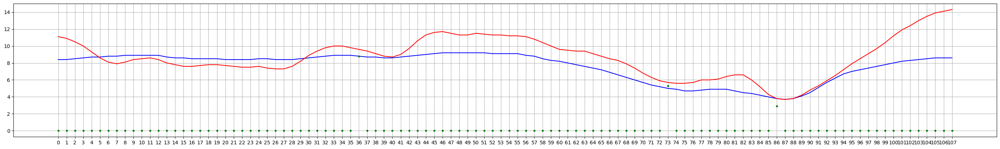

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

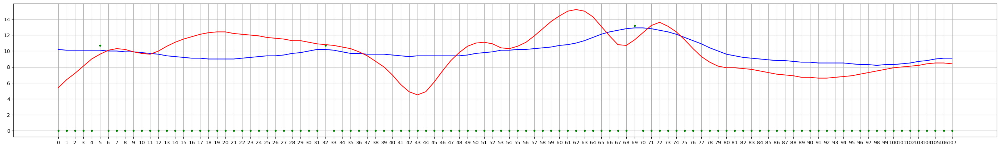

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

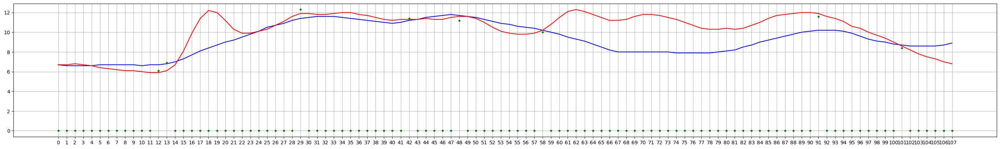

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

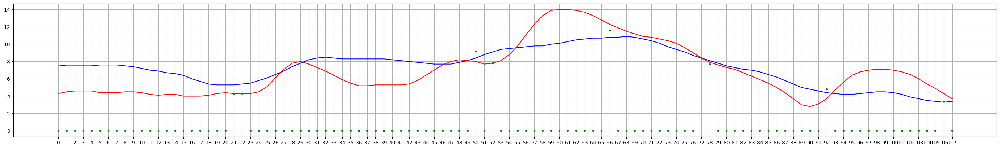

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

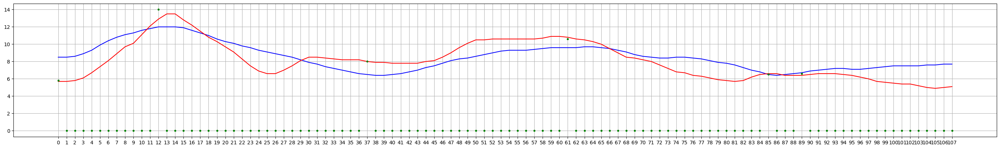

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

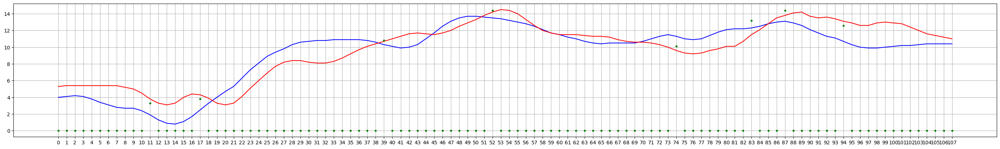

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

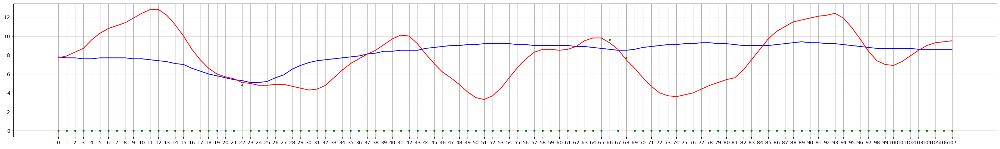

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

#15K vs 5K? -> 15K

##5K and different number of epochs

In [ ]:
df_cgm = pd.read_csv('drive/MyDrive/Senior Project: Diabetes T1/Datasets/Dataset#2/Processed/cont_gm_6_to_24_aligned_cleaned_1mmL_max.csv')
df_ibg = pd.read_csv('drive/MyDrive/Senior Project: Diabetes T1/Datasets/Dataset#2/Processed/inter_bg_6_to_24_aligned_cleaned_1mmL_max.csv')
df_i = df_ibg.drop(columns=['PtID', 'Dt'])
df_c = df_cgm.drop(columns=['PtID', 'Dt'])

X_train, X_test, y_train, y_test = skm.train_test_split(df_i, df_c, test_size=0.2, random_state=0)
X_train = X_train.values.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.values.reshape(X_test.shape[0], X_test.shape[1], 1)

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

In [ ]:
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)

In [ ]:
epochs = 200
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/200
130/130 - 2s - loss: 12.8267 - mean_absolute_error: 2.6698 - val_loss: 7.7181 - val_mean_absolute_error: 2.1334 - 2s/epoch - 17ms/step
Epoch 2/200
130/130 - 1s - loss: 7.1708 - mean_absolute_error: 2.0433 - val_loss: 6.3350 - val_mean_absolute_error: 1.8715 - 1s/epoch - 9ms/step
Epoch 3/200
130/130 - 1s - loss: 6.0137 - mean_absolute_error: 1.8124 - val_loss: 5.5329 - val_mean_absolute_error: 1.7097 - 1s/epoch - 9ms/step
Epoch 4/200
130/130 - 1s - loss: 5.6912 - mean_absolute_error: 1.7468 - val_loss: 5.3773 - val_mean_absolute_error: 1.6920 - 1s/epoch - 9ms/step
Epoch 5/200
130/130 - 1s - loss: 5.5761 - mean_absolute_error: 1.7229 - val_loss: 5.3321 - val_mean_absolute_error: 1.6891 - 1s/epoch - 9ms/step
Epoch 6/200
130/130 - 1s - loss: 5.5068 - mean_absolute_error: 1.7084 - val_loss: 5.3122 - val_mean_absolute_error: 1.6807 - 1s/epoch - 9ms/step
Epoch 7/200
130/130 - 1s - loss: 5.4521 - mean_absolute_error: 1.6995 - val_loss: 5.5220 - val_mean_absolute_error: 1.6687 - 1s/

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

36/36 [==============================] - 0s 3ms/step
['rmse: ', 1.602853521485906]
['mae: ', 1.0742118677971955]
['mape: ', 0.1465545334469945]


In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)
epochs = 100
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/100
130/130 - 4s - loss: 12.8979 - mean_absolute_error: 2.6773 - val_loss: 8.0093 - val_mean_absolute_error: 2.1612 - 4s/epoch - 30ms/step
Epoch 2/100
130/130 - 2s - loss: 7.1098 - mean_absolute_error: 2.0220 - val_loss: 6.0291 - val_mean_absolute_error: 1.8327 - 2s/epoch - 17ms/step
Epoch 3/100
130/130 - 3s - loss: 6.0015 - mean_absolute_error: 1.8078 - val_loss: 5.5368 - val_mean_absolute_error: 1.7321 - 3s/epoch - 25ms/step
Epoch 4/100
130/130 - 4s - loss: 5.7289 - mean_absolute_error: 1.7566 - val_loss: 5.4375 - val_mean_absolute_error: 1.7060 - 4s/epoch - 31ms/step
Epoch 5/100
130/130 - 2s - loss: 5.6216 - mean_absolute_error: 1.7321 - val_loss: 5.4707 - val_mean_absolute_error: 1.7262 - 2s/epoch - 14ms/step
Epoch 6/100
130/130 - 1s - loss: 5.6106 - mean_absolute_error: 1.7326 - val_loss: 5.4488 - val_mean_absolute_error: 1.7337 - 1s/epoch - 9ms/step
Epoch 7/100
130/130 - 1s - loss: 5.4758 - mean_absolute_error: 1.7047 - val_loss: 5.4327 - val_mean_absolute_error: 1.7012 -

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

36/36 [==============================] - 0s 3ms/step
['rmse: ', 1.3629071859648358]
['mae: ', 0.9293212363216807]
['mape: ', 0.1295283087231271]


In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
130/130 - 3s - loss: 13.1207 - mean_absolute_error: 2.6953 - val_loss: 8.5454 - val_mean_absolute_error: 2.3711 - 3s/epoch - 27ms/step
Epoch 2/50
130/130 - 2s - loss: 7.3480 - mean_absolute_error: 2.0736 - val_loss: 6.4597 - val_mean_absolute_error: 1.9052 - 2s/epoch - 14ms/step
Epoch 3/50
130/130 - 1s - loss: 6.1089 - mean_absolute_error: 1.8304 - val_loss: 5.7094 - val_mean_absolute_error: 1.7645 - 1s/epoch - 9ms/step
Epoch 4/50
130/130 - 1s - loss: 5.7250 - mean_absolute_error: 1.7512 - val_loss: 5.4218 - val_mean_absolute_error: 1.7068 - 1s/epoch - 9ms/step
Epoch 5/50
130/130 - 1s - loss: 5.6106 - mean_absolute_error: 1.7292 - val_loss: 5.5456 - val_mean_absolute_error: 1.6680 - 1s/epoch - 9ms/step
Epoch 6/50
130/130 - 1s - loss: 5.5736 - mean_absolute_error: 1.7229 - val_loss: 5.4524 - val_mean_absolute_error: 1.6918 - 1s/epoch - 9ms/step
Epoch 7/50
130/130 - 2s - loss: 5.4688 - mean_absolute_error: 1.6999 - val_loss: 5.3299 - val_mean_absolute_error: 1.6722 - 2s/epoch 

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

36/36 [==============================] - 0s 7ms/step
['rmse: ', 1.1440481049865046]
['mae: ', 0.8368623819167945]
['mape: ', 0.1200098892268381]


In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)
epochs = 20
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/20
130/130 - 5s - loss: 14.4957 - mean_absolute_error: 2.8432 - val_loss: 7.9043 - val_mean_absolute_error: 2.1976 - 5s/epoch - 37ms/step
Epoch 2/20
130/130 - 1s - loss: 7.4250 - mean_absolute_error: 2.0875 - val_loss: 6.5553 - val_mean_absolute_error: 1.9045 - 1s/epoch - 9ms/step
Epoch 3/20
130/130 - 1s - loss: 6.1629 - mean_absolute_error: 1.8446 - val_loss: 5.6263 - val_mean_absolute_error: 1.7426 - 1s/epoch - 9ms/step
Epoch 4/20
130/130 - 1s - loss: 5.7983 - mean_absolute_error: 1.7667 - val_loss: 5.3662 - val_mean_absolute_error: 1.6931 - 1s/epoch - 9ms/step
Epoch 5/20
130/130 - 1s - loss: 5.6192 - mean_absolute_error: 1.7299 - val_loss: 5.3437 - val_mean_absolute_error: 1.6652 - 1s/epoch - 9ms/step
Epoch 6/20
130/130 - 1s - loss: 5.5483 - mean_absolute_error: 1.7191 - val_loss: 5.3220 - val_mean_absolute_error: 1.6859 - 1s/epoch - 9ms/step
Epoch 7/20
130/130 - 1s - loss: 5.5204 - mean_absolute_error: 1.7162 - val_loss: 5.2997 - val_mean_absolute_error: 1.6616 - 1s/epoch -

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

36/36 [==============================] - 1s 7ms/step
['rmse: ', 1.0852957256668818]
['mae: ', 0.7883733551659914]
['mape: ', 0.12213158156301665]


In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)
epochs = 10
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/10
130/130 - 5s - loss: 13.2539 - mean_absolute_error: 2.7041 - val_loss: 7.6882 - val_mean_absolute_error: 2.1267 - 5s/epoch - 40ms/step
Epoch 2/10
130/130 - 2s - loss: 7.2525 - mean_absolute_error: 2.0638 - val_loss: 6.5743 - val_mean_absolute_error: 1.9321 - 2s/epoch - 15ms/step
Epoch 3/10
130/130 - 2s - loss: 6.0747 - mean_absolute_error: 1.8290 - val_loss: 6.3028 - val_mean_absolute_error: 1.8633 - 2s/epoch - 13ms/step
Epoch 4/10
130/130 - 1s - loss: 5.6081 - mean_absolute_error: 1.7277 - val_loss: 5.3366 - val_mean_absolute_error: 1.6888 - 1s/epoch - 9ms/step
Epoch 5/10
130/130 - 1s - loss: 5.4889 - mean_absolute_error: 1.7046 - val_loss: 5.6913 - val_mean_absolute_error: 1.7523 - 1s/epoch - 9ms/step
Epoch 6/10
130/130 - 1s - loss: 5.4517 - mean_absolute_error: 1.6943 - val_loss: 5.2774 - val_mean_absolute_error: 1.6666 - 1s/epoch - 9ms/step
Epoch 7/10
130/130 - 1s - loss: 5.4323 - mean_absolute_error: 1.6944 - val_loss: 5.2748 - val_mean_absolute_error: 1.6736 - 1s/epoch

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

36/36 [==============================] - 0s 6ms/step
['rmse: ', 1.0961601165785007]
['mae: ', 0.8410445524563895]
['mape: ', 0.12332216924336518]


In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.003),
              metrics=keras.metrics.mean_absolute_error)
epochs = 20
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/20
130/130 - 6s - loss: 12.8321 - mean_absolute_error: 2.6552 - val_loss: 7.7544 - val_mean_absolute_error: 2.0861 - 6s/epoch - 48ms/step
Epoch 2/20
130/130 - 3s - loss: 6.7804 - mean_absolute_error: 1.9663 - val_loss: 5.7972 - val_mean_absolute_error: 1.7703 - 3s/epoch - 22ms/step
Epoch 3/20
130/130 - 2s - loss: 5.7793 - mean_absolute_error: 1.7636 - val_loss: 5.3882 - val_mean_absolute_error: 1.6844 - 2s/epoch - 18ms/step
Epoch 4/20
130/130 - 2s - loss: 5.5908 - mean_absolute_error: 1.7244 - val_loss: 5.6763 - val_mean_absolute_error: 1.7926 - 2s/epoch - 15ms/step
Epoch 5/20
130/130 - 1s - loss: 5.5607 - mean_absolute_error: 1.7171 - val_loss: 5.5420 - val_mean_absolute_error: 1.7051 - 1s/epoch - 10ms/step
Epoch 6/20
130/130 - 1s - loss: 5.5060 - mean_absolute_error: 1.7080 - val_loss: 5.3485 - val_mean_absolute_error: 1.6558 - 1s/epoch - 9ms/step
Epoch 7/20
130/130 - 1s - loss: 5.4522 - mean_absolute_error: 1.6992 - val_loss: 5.3877 - val_mean_absolute_error: 1.7063 - 1s/epo

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

36/36 [==============================] - 0s 3ms/step
['rmse: ', 1.0351996863223014]
['mae: ', 0.7602455104873254]
['mape: ', 0.11702972623539296]


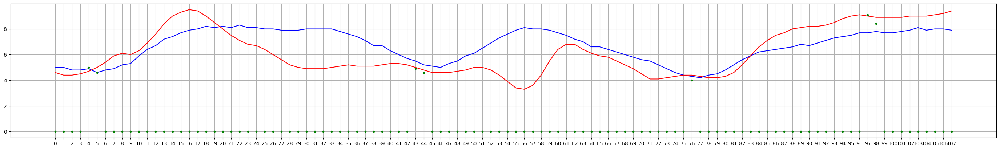

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 10
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

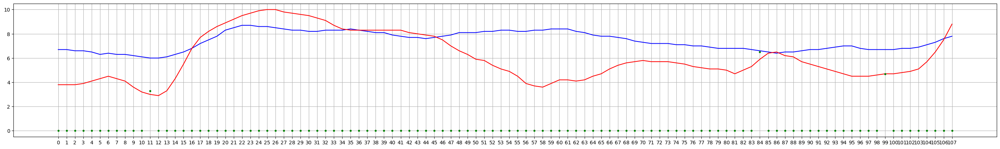

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

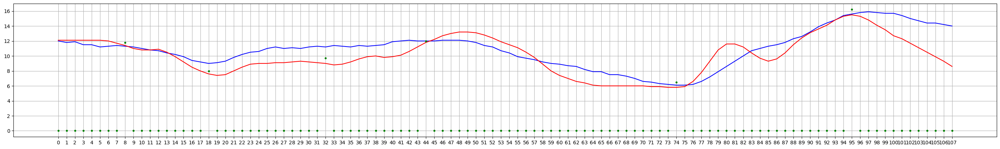

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

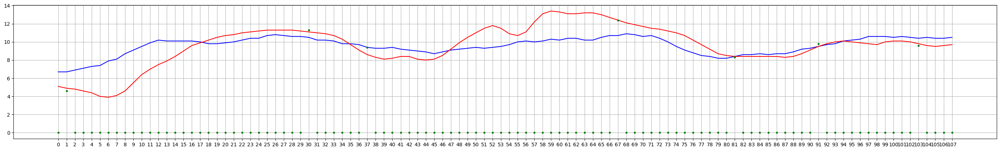

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

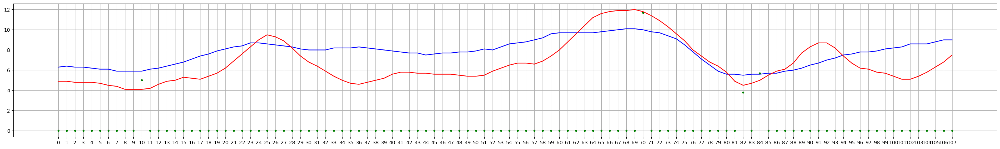

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

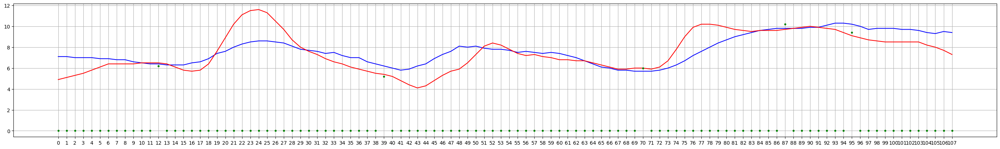

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

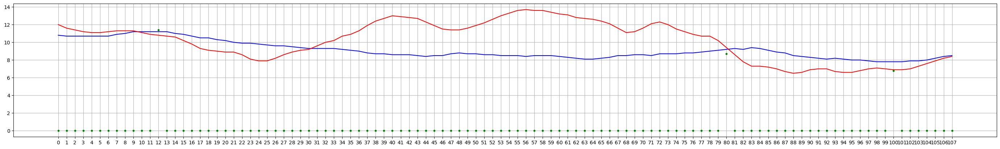

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 555
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

#Learning rate and Loss

##<- lr=0.001

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 8s - loss: 11.6801 - mean_absolute_error: 2.5487 - val_loss: 7.1263 - val_mean_absolute_error: 2.0737 - 8s/epoch - 21ms/step
Epoch 2/50
364/364 - 6s - loss: 6.4512 - mean_absolute_error: 1.9159 - val_loss: 5.5666 - val_mean_absolute_error: 1.7285 - 6s/epoch - 16ms/step
Epoch 3/50
364/364 - 6s - loss: 5.5736 - mean_absolute_error: 1.7385 - val_loss: 5.4151 - val_mean_absolute_error: 1.6980 - 6s/epoch - 15ms/step
Epoch 4/50
364/364 - 5s - loss: 5.4464 - mean_absolute_error: 1.7142 - val_loss: 5.3109 - val_mean_absolute_error: 1.6839 - 5s/epoch - 15ms/step
Epoch 5/50
364/364 - 7s - loss: 5.4068 - mean_absolute_error: 1.7050 - val_loss: 5.2896 - val_mean_absolute_error: 1.6685 - 7s/epoch - 19ms/step
Epoch 6/50
364/364 - 5s - loss: 5.3664 - mean_absolute_error: 1.6975 - val_loss: 5.3123 - val_mean_absolute_error: 1.6708 - 5s/epoch - 15ms/step
Epoch 7/50
364/364 - 6s - loss: 5.3502 - mean_absolute_error: 1.6942 - val_loss: 5.4469 - val_mean_absolute_error: 1.6882 - 6s/ep

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 5ms/step
['rmse: ', 1.0244690337488191]
['mae: ', 0.7451163488408249]
['mape: ', 0.1067629680483189]


In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.0005),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 10s - loss: 15.3350 - mean_absolute_error: 2.9092 - val_loss: 8.2382 - val_mean_absolute_error: 2.2748 - 10s/epoch - 27ms/step
Epoch 2/50
364/364 - 5s - loss: 7.4264 - mean_absolute_error: 2.0993 - val_loss: 6.5620 - val_mean_absolute_error: 1.9886 - 5s/epoch - 15ms/step
Epoch 3/50
364/364 - 5s - loss: 6.0143 - mean_absolute_error: 1.8312 - val_loss: 5.5096 - val_mean_absolute_error: 1.7342 - 5s/epoch - 15ms/step
Epoch 4/50
364/364 - 5s - loss: 5.5340 - mean_absolute_error: 1.7308 - val_loss: 5.4570 - val_mean_absolute_error: 1.7295 - 5s/epoch - 14ms/step
Epoch 5/50
364/364 - 6s - loss: 5.4340 - mean_absolute_error: 1.7097 - val_loss: 5.3229 - val_mean_absolute_error: 1.6976 - 6s/epoch - 16ms/step
Epoch 6/50
364/364 - 5s - loss: 5.4006 - mean_absolute_error: 1.7035 - val_loss: 5.2869 - val_mean_absolute_error: 1.6743 - 5s/epoch - 14ms/step
Epoch 7/50
364/364 - 4s - loss: 5.3798 - mean_absolute_error: 1.6985 - val_loss: 5.2831 - val_mean_absolute_error: 1.6697 - 4s/

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 5ms/step
['rmse: ', 1.0246522274701895]
['mae: ', 0.7533751410600522]
['mape: ', 0.10720998403002378]


##<-MAE as loss

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(32, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])
model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 4s - loss: 2.4836 - mean_absolute_error: 2.4836 - val_loss: 1.8962 - val_mean_absolute_error: 1.8962 - 4s/epoch - 12ms/step
Epoch 2/50
364/364 - 3s - loss: 1.7546 - mean_absolute_error: 1.7546 - val_loss: 1.6842 - val_mean_absolute_error: 1.6842 - 3s/epoch - 9ms/step
Epoch 3/50
364/364 - 4s - loss: 1.6837 - mean_absolute_error: 1.6837 - val_loss: 1.6594 - val_mean_absolute_error: 1.6594 - 4s/epoch - 10ms/step
Epoch 4/50
364/364 - 4s - loss: 1.6720 - mean_absolute_error: 1.6720 - val_loss: 1.6657 - val_mean_absolute_error: 1.6657 - 4s/epoch - 11ms/step
Epoch 5/50
364/364 - 3s - loss: 1.6663 - mean_absolute_error: 1.6663 - val_loss: 1.6525 - val_mean_absolute_error: 1.6525 - 3s/epoch - 9ms/step
Epoch 6/50
364/364 - 3s - loss: 1.6581 - mean_absolute_error: 1.6581 - val_loss: 1.6398 - val_mean_absolute_error: 1.6398 - 3s/epoch - 9ms/step
Epoch 7/50
364/364 - 5s - loss: 1.6561 - mean_absolute_error: 1.6561 - val_loss: 1.6594 - val_mean_absolute_error: 1.6594 - 5s/epoch 

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 7ms/step
['rmse: ', 0.8726145419687571]
['mae: ', 0.6156511809337604]
['mape: ', 0.08709920104437953]


#Configuration

##64-64-32

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(64, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 10s - loss: 2.4947 - mean_absolute_error: 2.4947 - val_loss: 1.8800 - val_mean_absolute_error: 1.8800 - 10s/epoch - 26ms/step
Epoch 2/50
364/364 - 7s - loss: 1.7540 - mean_absolute_error: 1.7540 - val_loss: 1.6940 - val_mean_absolute_error: 1.6940 - 7s/epoch - 19ms/step
Epoch 3/50
364/364 - 6s - loss: 1.6902 - mean_absolute_error: 1.6902 - val_loss: 1.6873 - val_mean_absolute_error: 1.6873 - 6s/epoch - 17ms/step
Epoch 4/50
364/364 - 7s - loss: 1.6745 - mean_absolute_error: 1.6745 - val_loss: 1.6546 - val_mean_absolute_error: 1.6546 - 7s/epoch - 20ms/step
Epoch 5/50
364/364 - 7s - loss: 1.6672 - mean_absolute_error: 1.6672 - val_loss: 1.6598 - val_mean_absolute_error: 1.6598 - 7s/epoch - 19ms/step
Epoch 6/50
364/364 - 7s - loss: 1.6630 - mean_absolute_error: 1.6630 - val_loss: 1.6463 - val_mean_absolute_error: 1.6463 - 7s/epoch - 21ms/step
Epoch 7/50
364/364 - 4s - loss: 1.6576 - mean_absolute_error: 1.6576 - val_loss: 1.6597 - val_mean_absolute_error: 1.6597 - 4s/e

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 0s 4ms/step
['rmse: ', 0.8470801013094176]
['mae: ', 0.6094517982565294]
['mape: ', 0.08359140087481713]


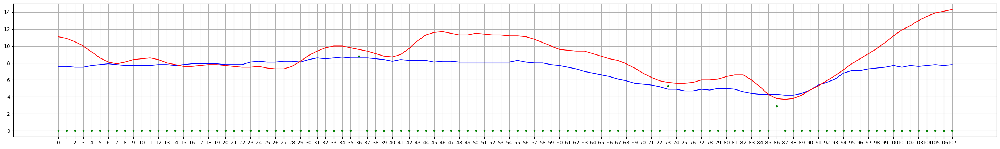

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

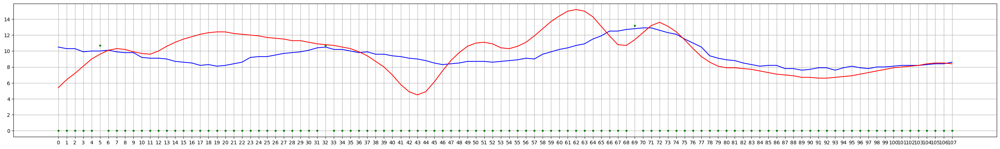

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

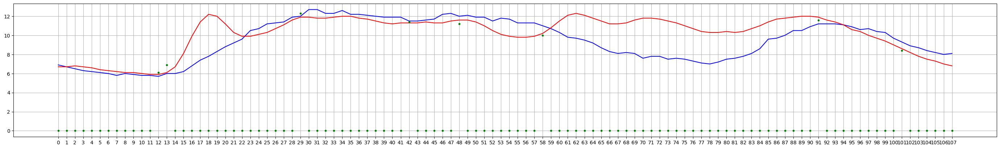

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

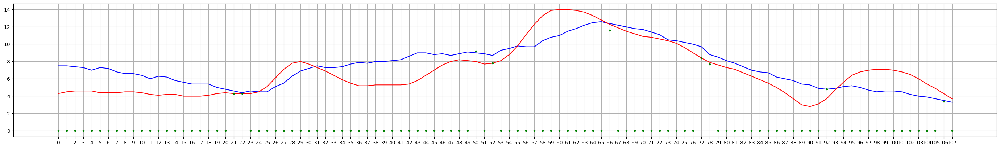

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

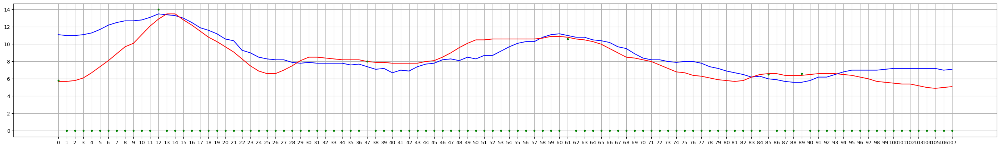

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

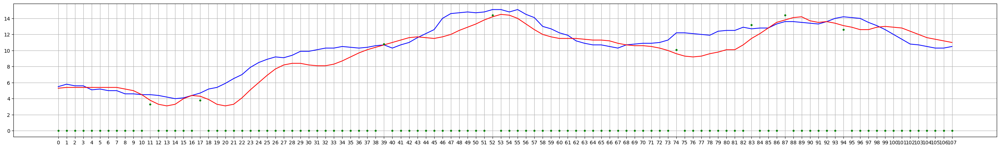

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

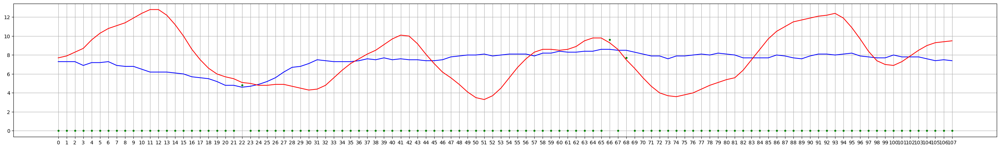

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##128-64-32

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(128, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 14s - loss: 2.4385 - mean_absolute_error: 2.4385 - val_loss: 1.8542 - val_mean_absolute_error: 1.8542 - 14s/epoch - 38ms/step
Epoch 2/50
364/364 - 10s - loss: 1.7883 - mean_absolute_error: 1.7883 - val_loss: 1.7140 - val_mean_absolute_error: 1.7140 - 10s/epoch - 29ms/step
Epoch 3/50
364/364 - 11s - loss: 1.7117 - mean_absolute_error: 1.7117 - val_loss: 1.6892 - val_mean_absolute_error: 1.6892 - 11s/epoch - 30ms/step
Epoch 4/50
364/364 - 7s - loss: 1.6892 - mean_absolute_error: 1.6892 - val_loss: 1.6636 - val_mean_absolute_error: 1.6636 - 7s/epoch - 18ms/step
Epoch 5/50
364/364 - 7s - loss: 1.6775 - mean_absolute_error: 1.6775 - val_loss: 1.6504 - val_mean_absolute_error: 1.6504 - 7s/epoch - 20ms/step
Epoch 6/50
364/364 - 6s - loss: 1.6713 - mean_absolute_error: 1.6713 - val_loss: 1.6651 - val_mean_absolute_error: 1.6651 - 6s/epoch - 17ms/step
Epoch 7/50
364/364 - 7s - loss: 1.6622 - mean_absolute_error: 1.6622 - val_loss: 1.6601 - val_mean_absolute_error: 1.6601 - 

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 8ms/step
['rmse: ', 0.8239141767835251]
['mae: ', 0.5858251686118016]
['mape: ', 0.08055790390072756]


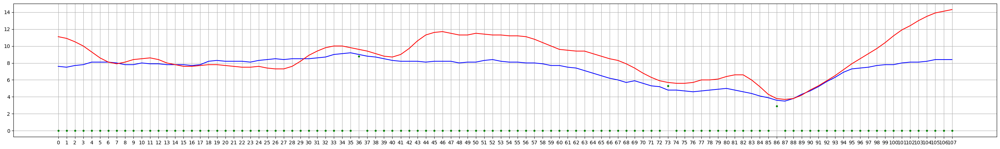

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

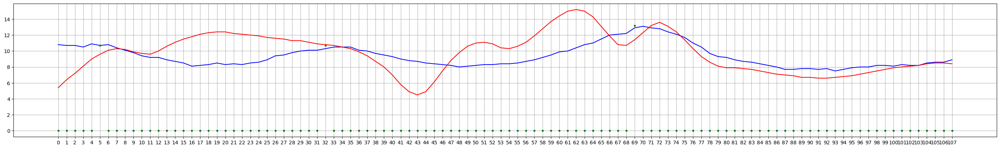

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

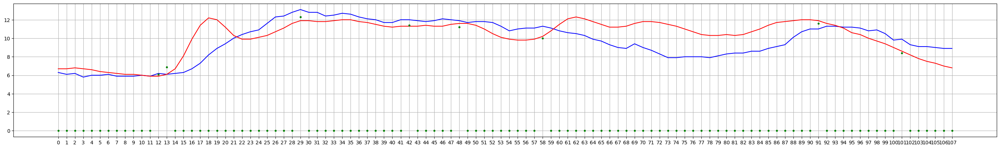

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

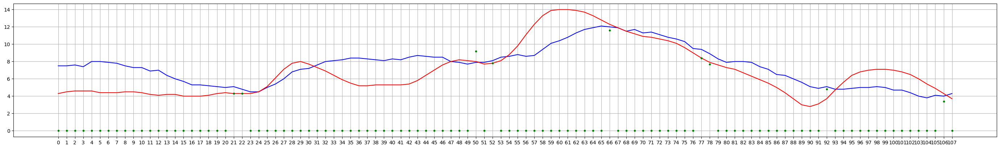

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

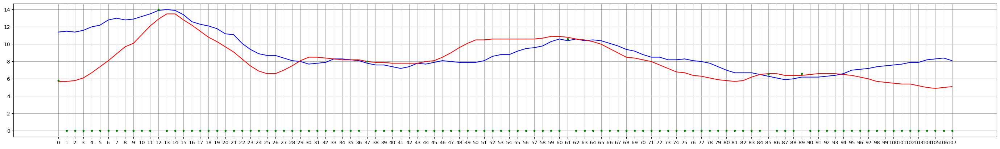

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

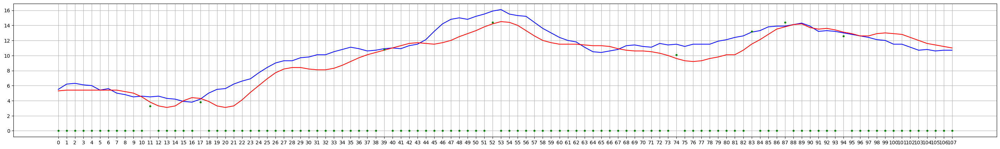

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

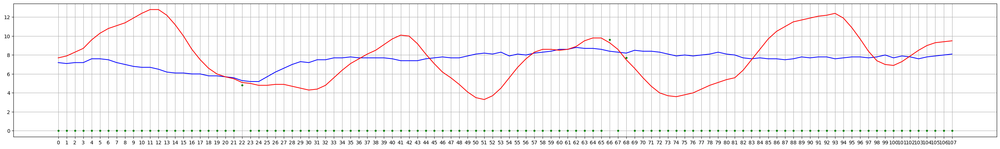

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##256-64-32

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(256, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 20s - loss: 2.3798 - mean_absolute_error: 2.3798 - val_loss: 1.8033 - val_mean_absolute_error: 1.8033 - 20s/epoch - 56ms/step
Epoch 2/50
364/364 - 17s - loss: 1.7453 - mean_absolute_error: 1.7453 - val_loss: 1.7257 - val_mean_absolute_error: 1.7257 - 17s/epoch - 47ms/step
Epoch 3/50
364/364 - 16s - loss: 1.6884 - mean_absolute_error: 1.6884 - val_loss: 1.6766 - val_mean_absolute_error: 1.6766 - 16s/epoch - 45ms/step
Epoch 4/50
364/364 - 15s - loss: 1.6748 - mean_absolute_error: 1.6748 - val_loss: 1.6782 - val_mean_absolute_error: 1.6782 - 15s/epoch - 41ms/step
Epoch 5/50
364/364 - 11s - loss: 1.6665 - mean_absolute_error: 1.6665 - val_loss: 1.6626 - val_mean_absolute_error: 1.6626 - 11s/epoch - 30ms/step
Epoch 6/50
364/364 - 11s - loss: 1.6590 - mean_absolute_error: 1.6590 - val_loss: 1.6835 - val_mean_absolute_error: 1.6835 - 11s/epoch - 30ms/step
Epoch 7/50
364/364 - 11s - loss: 1.6582 - mean_absolute_error: 1.6582 - val_loss: 1.6439 - val_mean_absolute_error: 1.

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 11ms/step
['rmse: ', 0.8218736798209382]
['mae: ', 0.6019437965368787]
['mape: ', 0.07771904945431837]


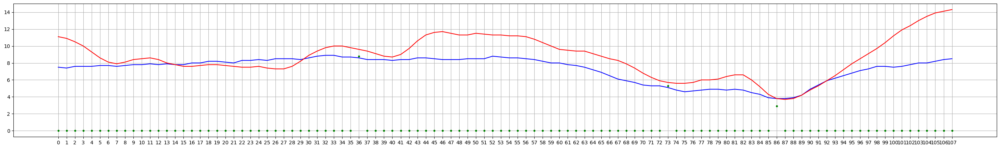

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

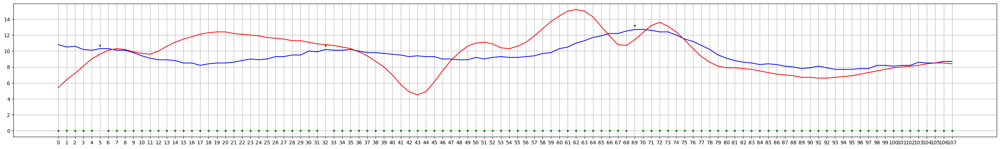

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

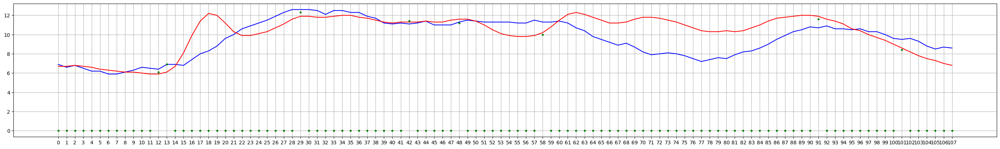

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

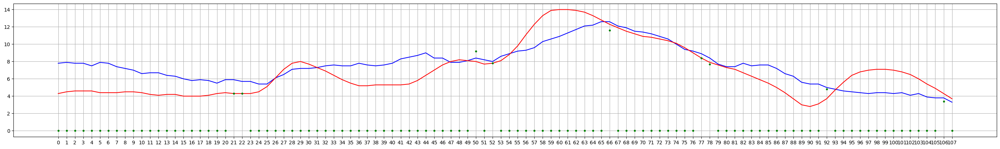

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

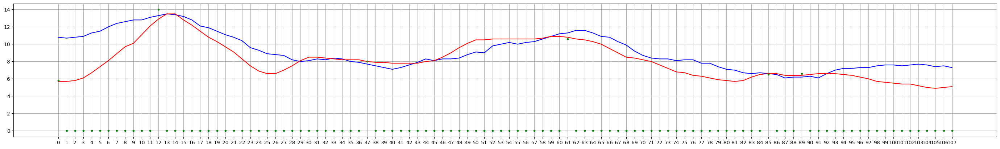

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

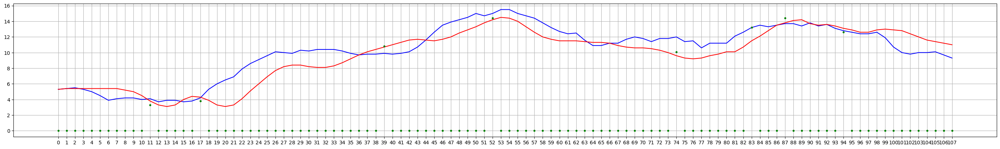

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

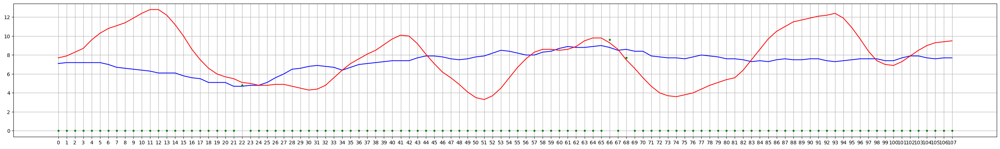

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##128-64-64

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(128, kernel_size=(5),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 14s - loss: 2.3699 - mean_absolute_error: 2.3699 - val_loss: 1.8157 - val_mean_absolute_error: 1.8157 - 14s/epoch - 38ms/step
Epoch 2/50
364/364 - 11s - loss: 1.7283 - mean_absolute_error: 1.7283 - val_loss: 1.6767 - val_mean_absolute_error: 1.6767 - 11s/epoch - 30ms/step
Epoch 3/50
364/364 - 11s - loss: 1.6799 - mean_absolute_error: 1.6799 - val_loss: 1.6576 - val_mean_absolute_error: 1.6576 - 11s/epoch - 29ms/step
Epoch 4/50
364/364 - 7s - loss: 1.6704 - mean_absolute_error: 1.6704 - val_loss: 1.6688 - val_mean_absolute_error: 1.6688 - 7s/epoch - 20ms/step
Epoch 5/50
364/364 - 7s - loss: 1.6616 - mean_absolute_error: 1.6616 - val_loss: 1.6397 - val_mean_absolute_error: 1.6397 - 7s/epoch - 20ms/step
Epoch 6/50
364/364 - 6s - loss: 1.6583 - mean_absolute_error: 1.6583 - val_loss: 1.6457 - val_mean_absolute_error: 1.6457 - 6s/epoch - 16ms/step
Epoch 7/50
364/364 - 7s - loss: 1.6515 - mean_absolute_error: 1.6515 - val_loss: 1.6401 - val_mean_absolute_error: 1.6401 - 

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 5ms/step
['rmse: ', 0.8734761611230284]
['mae: ', 0.6263444268778477]
['mape: ', 0.0822488271449392]


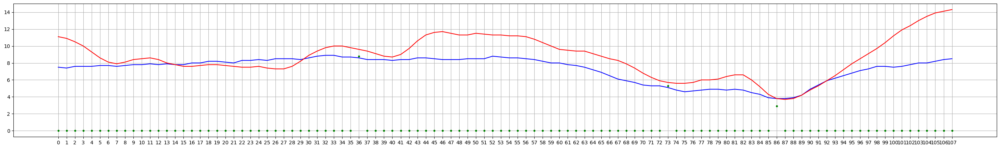

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

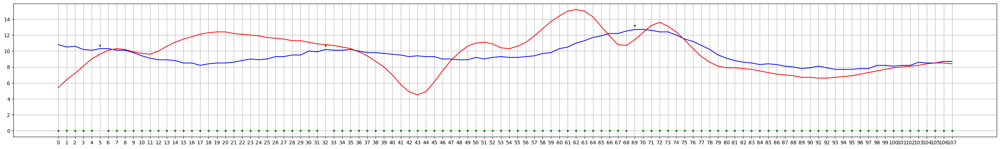

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

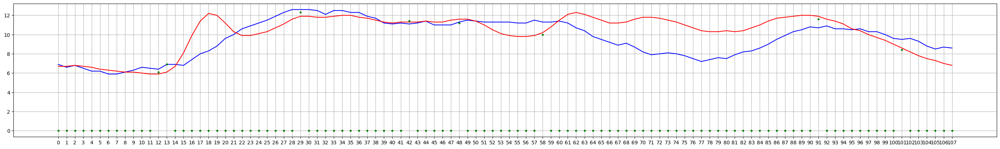

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

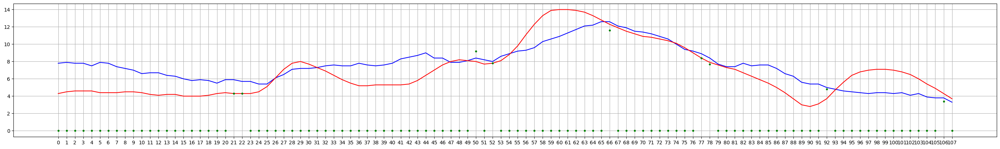

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

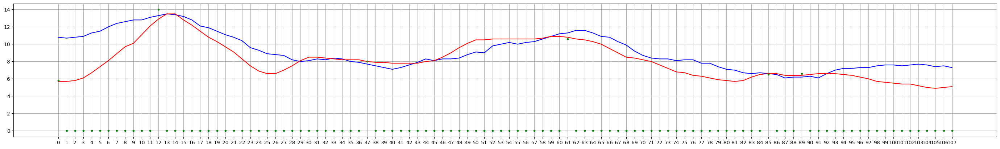

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

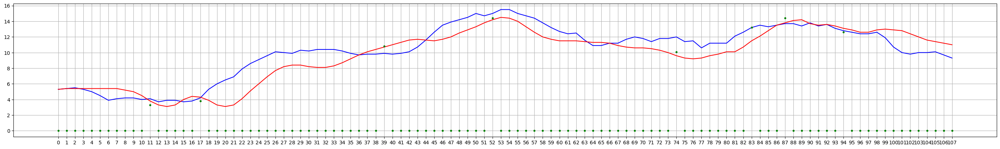

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

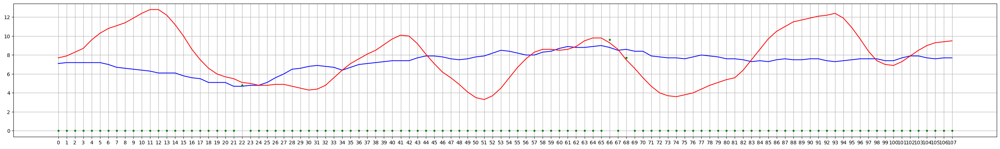

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##128-64-32 (1st kernel=4)

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(128, kernel_size=(4),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 10s - loss: 2.4639 - mean_absolute_error: 2.4639 - val_loss: 1.8481 - val_mean_absolute_error: 1.8481 - 10s/epoch - 27ms/step
Epoch 2/50
364/364 - 8s - loss: 1.7684 - mean_absolute_error: 1.7684 - val_loss: 1.7036 - val_mean_absolute_error: 1.7036 - 8s/epoch - 22ms/step
Epoch 3/50
364/364 - 7s - loss: 1.7124 - mean_absolute_error: 1.7124 - val_loss: 1.7010 - val_mean_absolute_error: 1.7010 - 7s/epoch - 19ms/step
Epoch 4/50
364/364 - 8s - loss: 1.6977 - mean_absolute_error: 1.6977 - val_loss: 1.7125 - val_mean_absolute_error: 1.7125 - 8s/epoch - 23ms/step
Epoch 5/50
364/364 - 7s - loss: 1.6906 - mean_absolute_error: 1.6906 - val_loss: 1.6924 - val_mean_absolute_error: 1.6924 - 7s/epoch - 19ms/step
Epoch 6/50
364/364 - 8s - loss: 1.6813 - mean_absolute_error: 1.6813 - val_loss: 1.6716 - val_mean_absolute_error: 1.6716 - 8s/epoch - 23ms/step
Epoch 7/50
364/364 - 7s - loss: 1.6827 - mean_absolute_error: 1.6827 - val_loss: 1.6705 - val_mean_absolute_error: 1.6705 - 7s/e

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 7ms/step
['rmse: ', 0.9166950595764352]
['mae: ', 0.6573006565115272]
['mape: ', 0.09078676586409622]


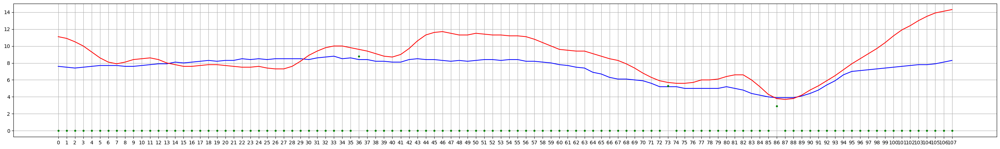

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

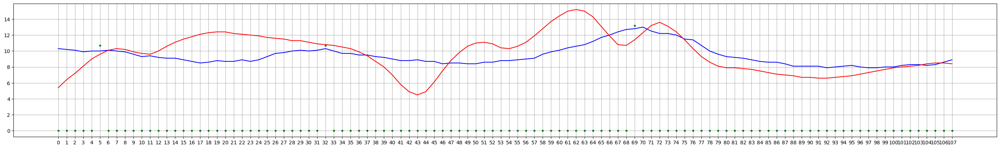

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

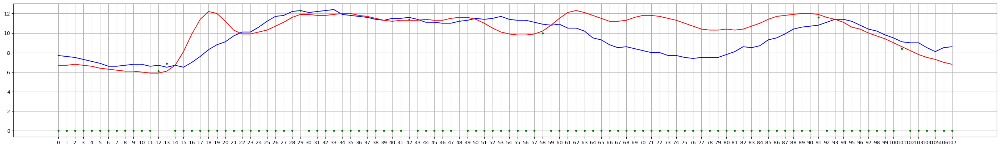

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

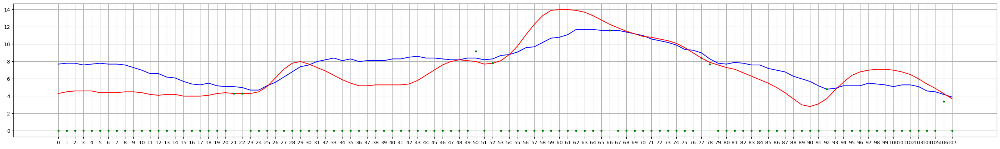

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

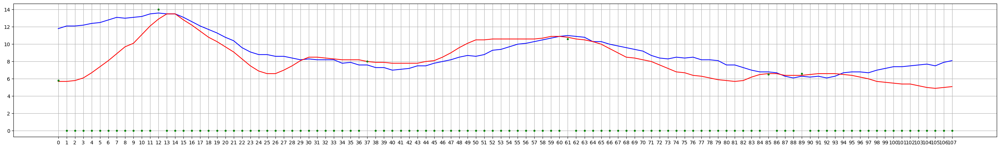

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

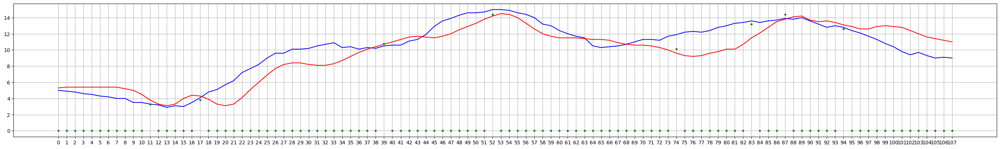

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

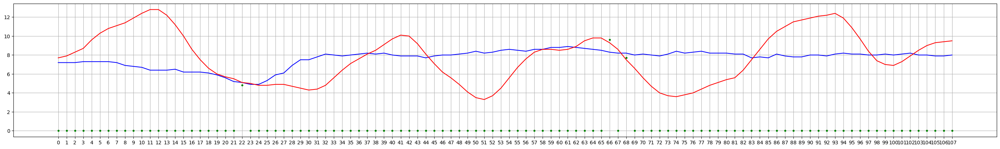

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

##128-64-32 (1st kernel=8)

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(128, kernel_size=(8),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Conv1D(32, (2), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 26s - loss: 2.3607 - mean_absolute_error: 2.3607 - val_loss: 1.7204 - val_mean_absolute_error: 1.7204 - 26s/epoch - 72ms/step
Epoch 2/50
364/364 - 16s - loss: 1.6882 - mean_absolute_error: 1.6882 - val_loss: 1.6346 - val_mean_absolute_error: 1.6346 - 16s/epoch - 44ms/step
Epoch 3/50
364/364 - 16s - loss: 1.6487 - mean_absolute_error: 1.6487 - val_loss: 1.6220 - val_mean_absolute_error: 1.6220 - 16s/epoch - 43ms/step
Epoch 4/50
364/364 - 14s - loss: 1.6365 - mean_absolute_error: 1.6365 - val_loss: 1.6149 - val_mean_absolute_error: 1.6149 - 14s/epoch - 39ms/step
Epoch 5/50
364/364 - 14s - loss: 1.6290 - mean_absolute_error: 1.6290 - val_loss: 1.6188 - val_mean_absolute_error: 1.6188 - 14s/epoch - 39ms/step
Epoch 6/50
364/364 - 14s - loss: 1.6212 - mean_absolute_error: 1.6212 - val_loss: 1.6129 - val_mean_absolute_error: 1.6129 - 14s/epoch - 39ms/step
Epoch 7/50
364/364 - 14s - loss: 1.6190 - mean_absolute_error: 1.6190 - val_loss: 1.6082 - val_mean_absolute_error: 1.

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 8ms/step
['rmse: ', 0.7161186183703881]
['mae: ', 0.5224579243883661]
['mape: ', 0.06976617689614507]


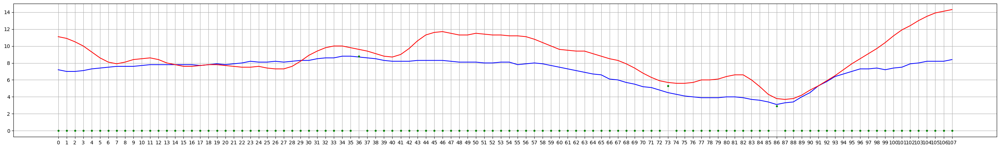

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

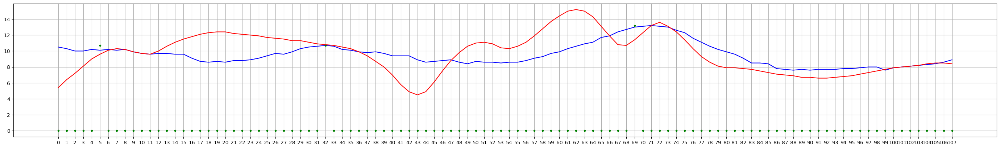

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

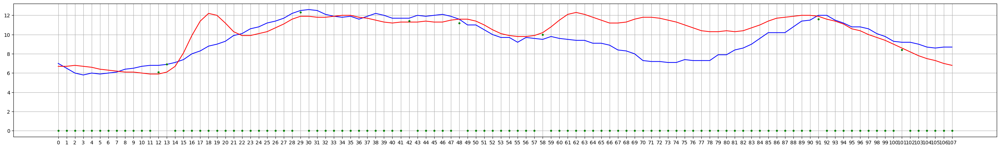

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

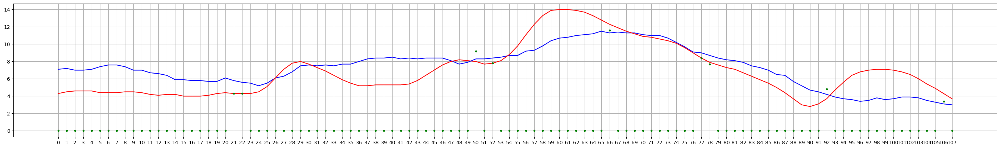

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

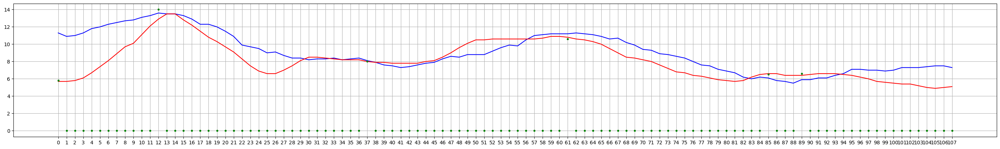

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

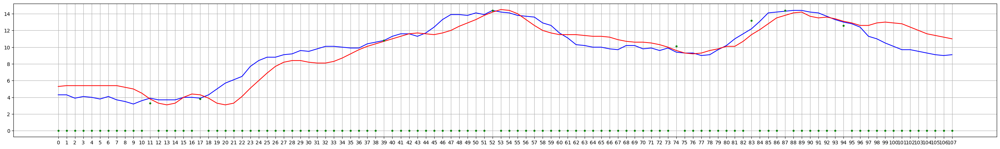

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

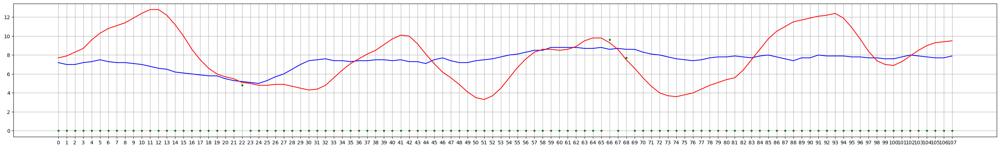

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

1/1 [==============================] - 0s 105ms/step


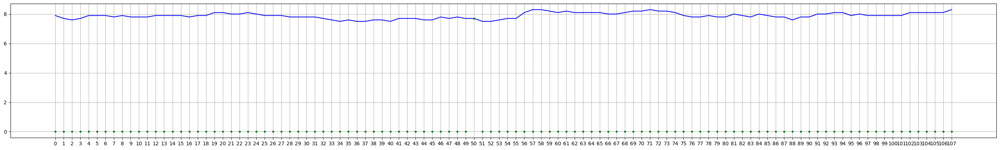

In [ ]:
#GENERATE
input = []
for i in range(108):
  input.append(0)
input[50] = 7.7
input = np.array(input).reshape(1, 108, 1)

pred_output = model.predict(input)
cols = []
for i in range(108):
  cols.append(str(i))
p = []
for i in pred_output[0]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = input[0].T[0]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()


1/1 [==============================] - 0s 70ms/step


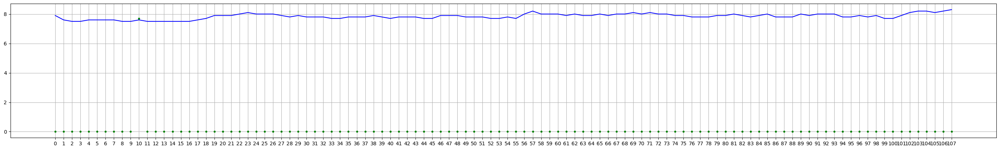

In [ ]:
#GENERATE
input = []
for i in range(108):
  input.append(0)
input[10] = 7.7
input = np.array(input).reshape(1, 108, 1)

pred_output = model.predict(input)
cols = []
for i in range(108):
  cols.append(str(i))
p = []
for i in pred_output[0]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = input[0].T[0]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()


##128-64-32 (8 4 4)

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(128, kernel_size=(8),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (4), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(4)),
    Conv1D(32, (4), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(4)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 19s - loss: 2.3583 - mean_absolute_error: 2.3583 - val_loss: 1.8498 - val_mean_absolute_error: 1.8498 - 19s/epoch - 53ms/step
Epoch 2/50
364/364 - 16s - loss: 1.7930 - mean_absolute_error: 1.7930 - val_loss: 1.7458 - val_mean_absolute_error: 1.7458 - 16s/epoch - 45ms/step
Epoch 3/50
364/364 - 16s - loss: 1.7346 - mean_absolute_error: 1.7346 - val_loss: 1.7187 - val_mean_absolute_error: 1.7187 - 16s/epoch - 45ms/step
Epoch 4/50
364/364 - 16s - loss: 1.7097 - mean_absolute_error: 1.7097 - val_loss: 1.7345 - val_mean_absolute_error: 1.7345 - 16s/epoch - 44ms/step
Epoch 5/50
364/364 - 16s - loss: 1.6933 - mean_absolute_error: 1.6933 - val_loss: 1.6903 - val_mean_absolute_error: 1.6903 - 16s/epoch - 44ms/step
Epoch 6/50
364/364 - 18s - loss: 1.6854 - mean_absolute_error: 1.6854 - val_loss: 1.6809 - val_mean_absolute_error: 1.6809 - 18s/epoch - 49ms/step
Epoch 7/50
364/364 - 13s - loss: 1.6709 - mean_absolute_error: 1.6709 - val_loss: 1.6615 - val_mean_absolute_error: 1.

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 9ms/step
['rmse: ', 0.7911824743875917]
['mae: ', 0.5928148002428102]
['mape: ', 0.07782076615272006]


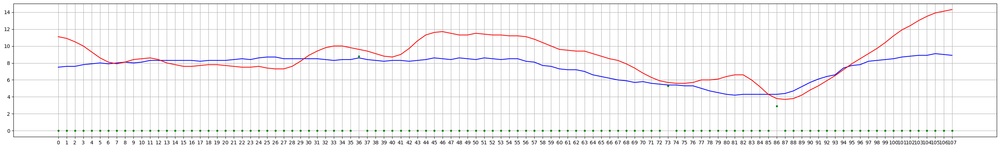

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

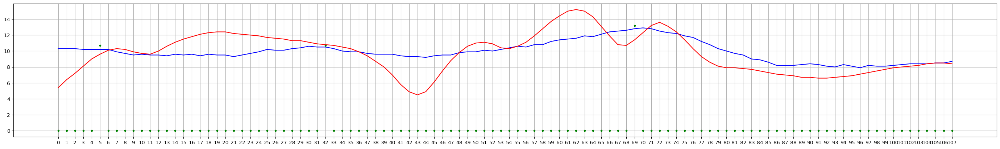

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

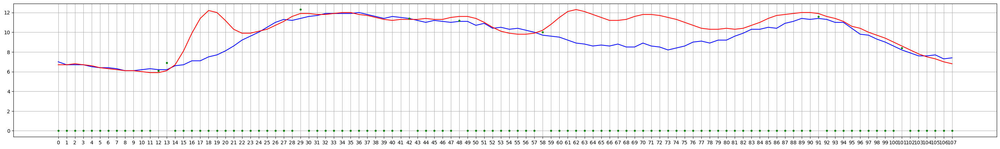

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

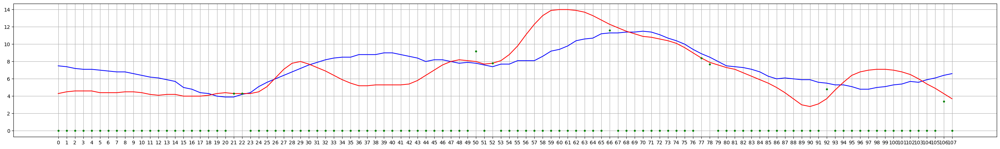

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

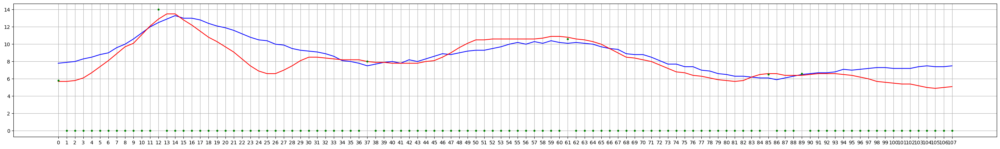

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

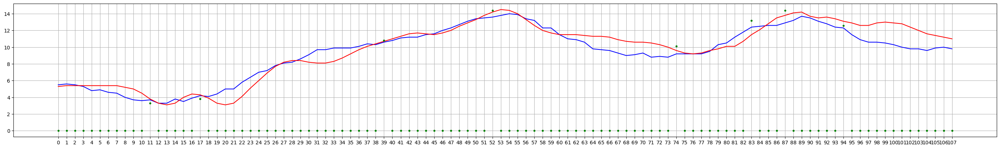

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

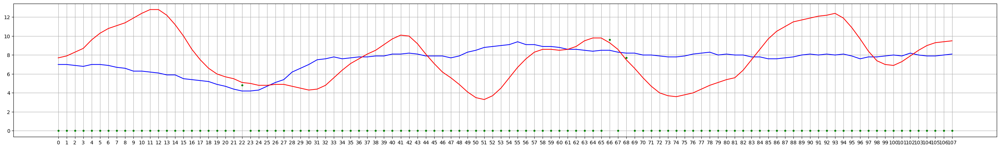

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

1/1 [==============================] - 0s 24ms/step


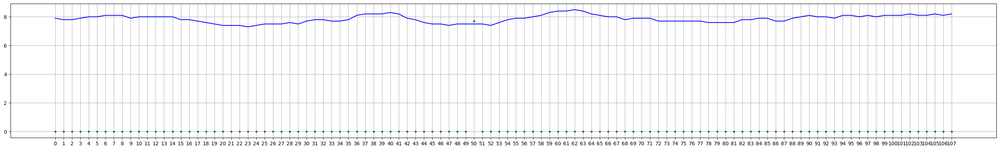

In [ ]:
#GENERATE
input = []
for i in range(108):
  input.append(0)
input[50] = 7.7
input = np.array(input).reshape(1, 108, 1)

pred_output = model.predict(input)
cols = []
for i in range(108):
  cols.append(str(i))
p = []
for i in pred_output[0]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = input[0].T[0]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()


1/1 [==============================] - 0s 41ms/step


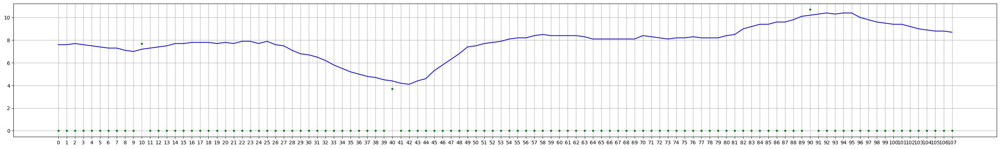

In [ ]:
#GENERATE
input = []
for i in range(108):
  input.append(0)
input[10] = 7.7
input[40] = 3.7
input[90] = 10.7
input = np.array(input).reshape(1, 108, 1)

pred_output = model.predict(input)
cols = []
for i in range(108):
  cols.append(str(i))
p = []
for i in pred_output[0]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = input[0].T[0]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()


##128-64-32 (8 8 4)

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(128, kernel_size=(8),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (8), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(4)),
    Conv1D(32, (4), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 40s - loss: 2.2005 - mean_absolute_error: 2.2005 - val_loss: 1.6787 - val_mean_absolute_error: 1.6787 - 40s/epoch - 109ms/step
Epoch 2/50
364/364 - 32s - loss: 1.6610 - mean_absolute_error: 1.6610 - val_loss: 1.6178 - val_mean_absolute_error: 1.6178 - 32s/epoch - 88ms/step
Epoch 3/50
364/364 - 34s - loss: 1.6266 - mean_absolute_error: 1.6266 - val_loss: 1.6068 - val_mean_absolute_error: 1.6068 - 34s/epoch - 93ms/step
Epoch 4/50
364/364 - 31s - loss: 1.6105 - mean_absolute_error: 1.6105 - val_loss: 1.5853 - val_mean_absolute_error: 1.5853 - 31s/epoch - 84ms/step
Epoch 5/50
364/364 - 26s - loss: 1.5980 - mean_absolute_error: 1.5980 - val_loss: 1.6081 - val_mean_absolute_error: 1.6081 - 26s/epoch - 71ms/step
Epoch 6/50
364/364 - 25s - loss: 1.5892 - mean_absolute_error: 1.5892 - val_loss: 1.5757 - val_mean_absolute_error: 1.5757 - 25s/epoch - 68ms/step
Epoch 7/50
364/364 - 22s - loss: 1.5812 - mean_absolute_error: 1.5812 - val_loss: 1.5737 - val_mean_absolute_error: 1

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 13ms/step
['rmse: ', 0.6466015126653509]
['mae: ', 0.5071196240364005]
['mape: ', 0.06486350162051364]


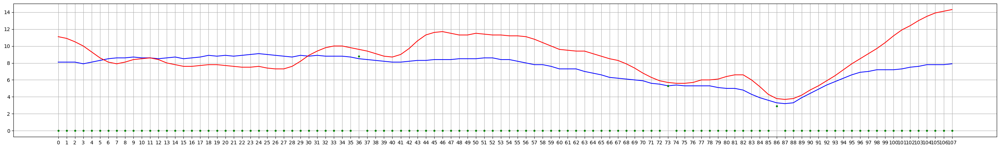

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

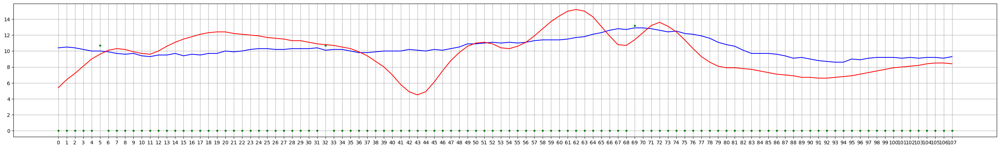

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

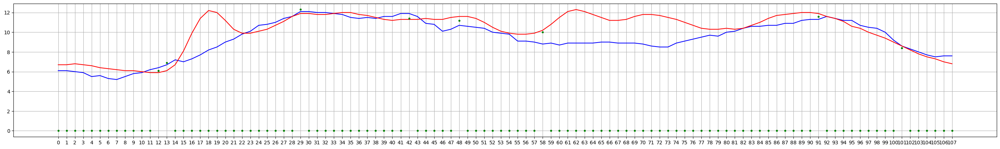

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

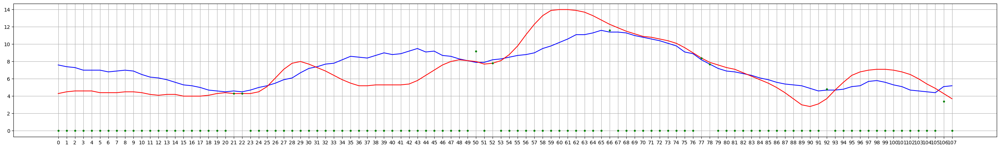

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

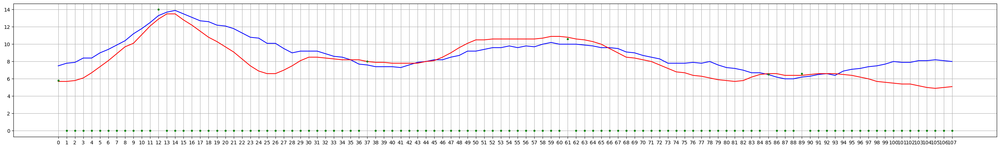

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

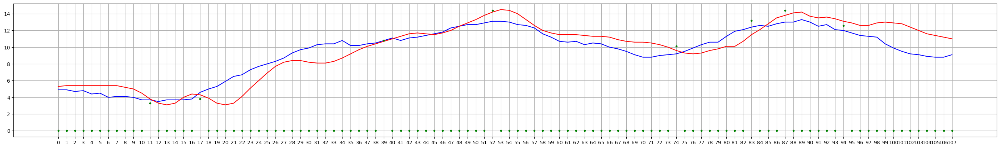

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

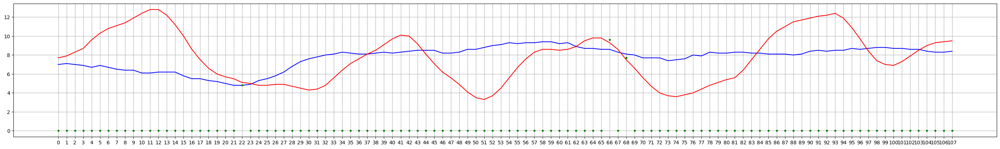

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

1/1 [==============================] - 0s 43ms/step


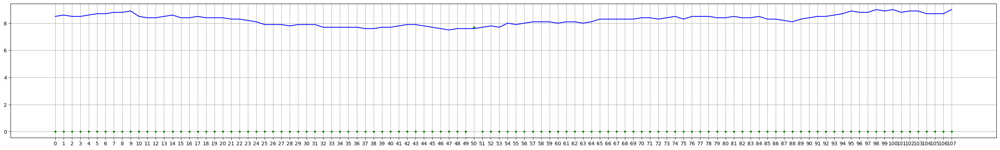

In [ ]:
#GENERATE
input = []
for i in range(108):
  input.append(0)
input[50] = 7.7
input = np.array(input).reshape(1, 108, 1)

pred_output = model.predict(input)
cols = []
for i in range(108):
  cols.append(str(i))
p = []
for i in pred_output[0]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = input[0].T[0]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()


1/1 [==============================] - 0s 41ms/step


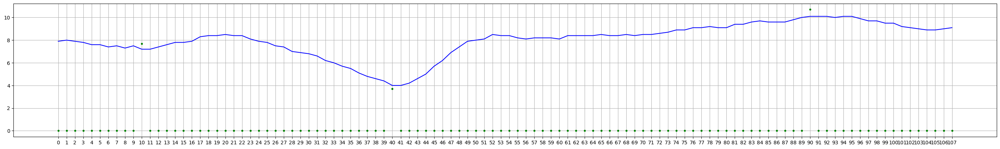

In [ ]:
#GENERATE
input = []
for i in range(108):
  input.append(0)
input[10] = 7.7
input[40] = 3.7
input[90] = 10.7
input = np.array(input).reshape(1, 108, 1)

pred_output = model.predict(input)
cols = []
for i in range(108):
  cols.append(str(i))
p = []
for i in pred_output[0]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = input[0].T[0]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()


##128-64-32 (8 8 4) This configuration chosen

In [ ]:
model = Sequential([
    Input(shape=(108, 1)),
    Conv1D(128, kernel_size=(8),
                 activation='relu',
                 padding='same'),
    Conv1D(64, (4), activation='relu', padding='same'),
    MaxPooling1D(pool_size=(2)),
    Flatten(),
    Dense(108)
])

model.compile(loss=keras.losses.mean_absolute_error,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=keras.metrics.mean_absolute_error)
epochs = 50
model.fit(X_train, y_train, epochs=epochs, verbose=2, validation_split=0.1)

Epoch 1/50
364/364 - 19s - loss: 2.1989 - mean_absolute_error: 2.1989 - val_loss: 1.7196 - val_mean_absolute_error: 1.7196 - 19s/epoch - 53ms/step
Epoch 2/50
364/364 - 16s - loss: 1.6762 - mean_absolute_error: 1.6762 - val_loss: 1.6482 - val_mean_absolute_error: 1.6482 - 16s/epoch - 45ms/step
Epoch 3/50
364/364 - 17s - loss: 1.6459 - mean_absolute_error: 1.6459 - val_loss: 1.6333 - val_mean_absolute_error: 1.6333 - 17s/epoch - 48ms/step
Epoch 4/50
364/364 - 16s - loss: 1.6389 - mean_absolute_error: 1.6389 - val_loss: 1.6307 - val_mean_absolute_error: 1.6307 - 16s/epoch - 43ms/step
Epoch 5/50
364/364 - 16s - loss: 1.6283 - mean_absolute_error: 1.6283 - val_loss: 1.6238 - val_mean_absolute_error: 1.6238 - 16s/epoch - 44ms/step
Epoch 6/50
364/364 - 17s - loss: 1.6204 - mean_absolute_error: 1.6204 - val_loss: 1.6205 - val_mean_absolute_error: 1.6205 - 17s/epoch - 46ms/step
Epoch 7/50
364/364 - 16s - loss: 1.6179 - mean_absolute_error: 1.6179 - val_loss: 1.6122 - val_mean_absolute_error: 1.

In [ ]:
pred = model.predict(X_test)

102/102 [==============================] - 3s 21ms/step


In [ ]:
pred.shape

(3235, 108)

In [ ]:
pred = model.predict(X_test)
print(['rmse: ', rmseData(X_test, pred)])
print(['mae: ', maeData(X_test, pred)])
print(['mape: ', mapeData(X_test, pred)])

102/102 [==============================] - 1s 13ms/step
['rmse: ', 0.6466015126653509]
['mae: ', 0.5071196240364005]
['mape: ', 0.06486350162051364]


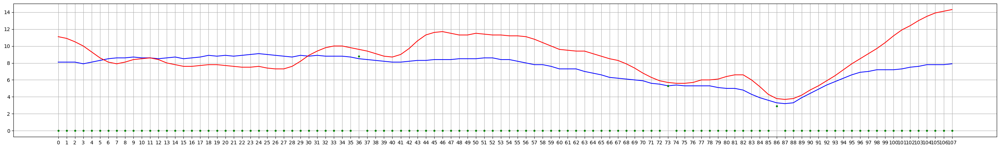

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 105
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

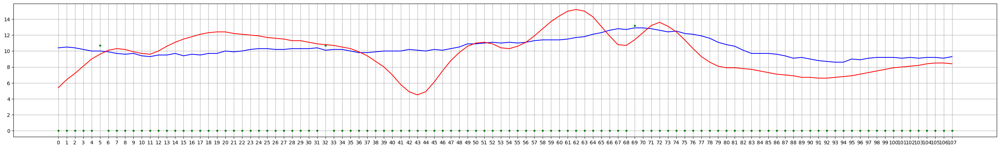

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 205
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

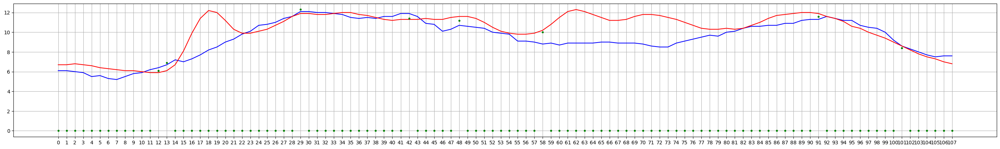

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1350
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

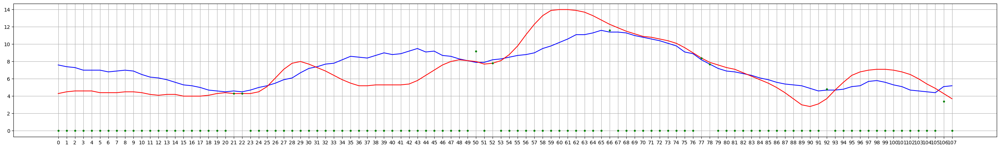

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

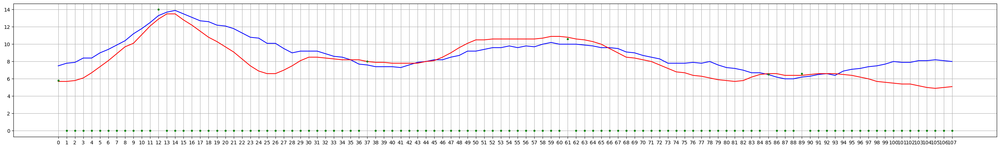

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 1950
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

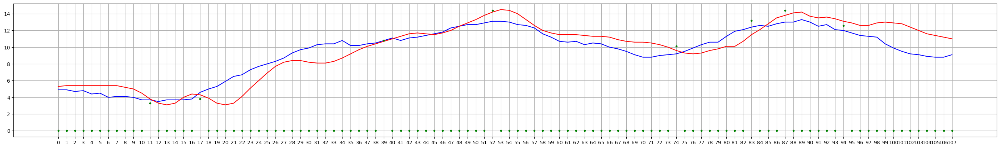

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2500
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

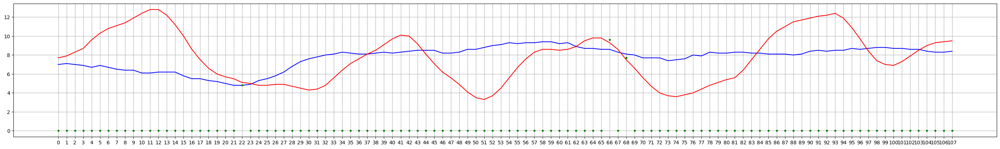

In [ ]:
cols = []
for i in range(108):
  cols.append(str(i))
k = 2550
p = []
for i in pred[k]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = X_test[k].T[0]
true_c = y_test.values[k]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_c, '-', color='r', label='true c')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()

1/1 [==============================] - 0s 43ms/step


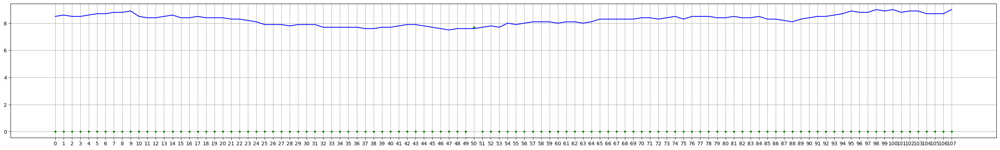

In [ ]:
#GENERATE
input = []
for i in range(108):
  input.append(0)
input[50] = 7.7
input = np.array(input).reshape(1, 108, 1)

pred_output = model.predict(input)
cols = []
for i in range(108):
  cols.append(str(i))
p = []
for i in pred_output[0]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = input[0].T[0]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()


1/1 [==============================] - 0s 26ms/step


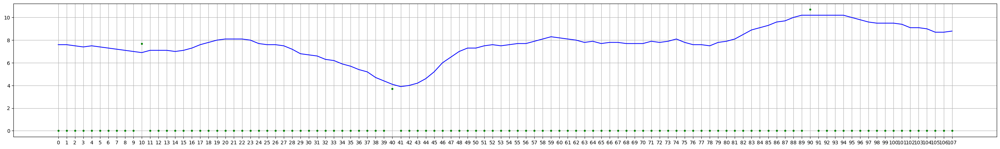

In [ ]:
#GENERATE
input = []
for i in range(108):
  input.append(0)
input[10] = 7.7
input[40] = 3.7
input[90] = 10.7
input = np.array(input).reshape(1, 108, 1)

pred_output = model.predict(input)
cols = []
for i in range(108):
  cols.append(str(i))
p = []
for i in pred_output[0]:
  p.append(round(i, 1))
pred_c = np.array(p)
true_i = input[0].T[0]

fig, ax = plt.subplots()
fig.set_figwidth(35)
ax.plot(cols, pred_c, '-', color='b', label='prediction')
ax.plot(cols, true_i, '.', color='g', label='true i')
plt.grid()
plt.show()


In [ ]:
pred_output.shape

(1, 108)

In [ ]:
pred_output


array([[ 7.563588 ,  7.57158  ,  7.5029583,  7.375044 ,  7.456248 ,
         7.4422398,  7.343526 ,  7.1753516,  7.086565 ,  6.9758186,
         6.941126 ,  7.1018558,  7.109276 ,  7.080042 ,  6.9692225,
         7.145973 ,  7.2673407,  7.6361885,  7.7545314,  7.977809 ,
         8.088367 ,  8.1383705,  8.057106 ,  7.963598 ,  7.7077575,
         7.6496263,  7.6130686,  7.5278893,  7.1994042,  6.7714157,
         6.696543 ,  6.5570493,  6.2935014,  6.2346916,  5.9433327,
         5.7197065,  5.380282 ,  5.200914 ,  4.736768 ,  4.425602 ,
         4.1441035,  3.901894 ,  3.9565432,  4.2051253,  4.5762362,
         5.199014 ,  6.0400105,  6.485719 ,  6.952286 ,  7.308393 ,
         7.314008 ,  7.4866624,  7.5791   ,  7.5071797,  7.5627046,
         7.661392 ,  7.715589 ,  7.858694 ,  8.115674 ,  8.286497 ,
         8.221958 ,  8.07033  ,  7.9573965,  7.7797728,  7.939966 ,
         7.703308 ,  7.8433723,  7.7876763,  7.7199645,  7.7174277,
         7.6797943,  7.8990545,  7.7643433,  7.8

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open('my_model.tflite', 'wb') as f:
  f.write(tflite_model)